# Estimating $T_{eff}(t)$ of the DWF "Monster" Flare via $\Delta DCR$

GAIA ID: 

Gaia DR3 4728703055241994752

In [2]:
%load_ext autoreload
%autoreload 2

import os
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from astropy.coordinates import SkyCoord, EarthLocation, AltAz, ICRS
from astropy.time import Time
from astropy.wcs import WCS
from astropy import units as u
from astropy.io import fits
from astropy import constants
from astropy.modeling.models import BlackBody
from astropy.visualization import quantity_support

from scipy.optimize import curve_fit

from utils import filt_interp, dpar, dtan, lamb_eff_md, dcr_offset, celest_to_pa, lorentzian
from config import *

import globals

## Data import

In [3]:
hdu_list = fits.open('/Users/riley/Desktop/RAFTS/dwfflare/0a7936112f3150350b27277900f88de2_c4d_151218_061807_ooi_g_v1.fits.fz')
hdu_list.info()

Filename: /Users/riley/Desktop/RAFTS/dwfflare/0a7936112f3150350b27277900f88de2_c4d_151218_061807_ooi_g_v1.fits.fz
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     251   ()      
  1  S29           1 CompImageHDU    129   (2046, 4094)   float32   
  2  S31           1 CompImageHDU    129   (2046, 4094)   float32   
  3  S25           1 CompImageHDU    129   (2046, 4094)   float32   
  4  S26           1 CompImageHDU    129   (2046, 4094)   float32   
  5  S27           1 CompImageHDU    129   (2046, 4094)   float32   
  6  S28           1 CompImageHDU    129   (2046, 4094)   float32   
  7  S20           1 CompImageHDU    129   (2046, 4094)   float32   
  8  S21           1 CompImageHDU    129   (2046, 4094)   float32   
  9  S22           1 CompImageHDU    129   (2046, 4094)   float32   
 10  S23           1 CompImageHDU    129   (2046, 4094)   float32   
 11  S24           1 CompImageHDU    129   (2046, 4094)   float32   
 12  S14      

In [4]:
imnames = np.array(os.listdir('/Users/riley/Desktop/RAFTS/dwfflare'))
imnames

array(['e43a92f1e7ff242e45474ab422077d27_c4d_151220_055011_ooi_g_v1.fits.fz',
       '5f7d7b3a43c128df8435b4a9a8bebf34_c4d_151218_063550_ooi_g_v1.fits.fz',
       '2fc4826f4d18162a319f908fb5368c70_c4d_151219_055430_ooi_g_v1.fits.fz',
       'fbbb587f979f62286628fdd8d08f3bf9_c4d_151218_062922_ooi_g_v1.fits.fz',
       'c2c814f805e2b1e5d26f448c6f9c7813_c4d_151219_055209_ooi_g_v1.fits.fz',
       '6e069b3ba2f921accc6c6bf54fbc8ea1_c4d_151218_061457_ooi_g_v1.fits.fz',
       '57b477997c643faafd6172419ab99ebb_c4d_151220_064829_ooi_g_v1.fits.fz',
       '617f9152b0999bf6181c91450a6b6e5e_c4d_151220_063452_ooi_g_v1.fits.fz',
       '26bfa65493deec77d452b8e434b2be36_c4d_151220_063002_ooi_g_v1.fits.fz',
       'ccd5b5b01509880da3c00e8011c65183_c4d_151218_064215_ooi_g_v1.fits.fz',
       '1cbc9395ac8d44a2754ecb78c2af2e76_c4d_151220_055500_ooi_g_v1.fits.fz',
       '25872bcfd0d9486c738f613a4f8f31e3_c4d_151218_064614_ooi_g_v1.fits.fz',
       '2435659a4749c786de394d194177803c_c4d_151218_062120_ooi_g

In [5]:
datelist = []

for i, imname in enumerate(imnames):
    try:
        image_header = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/' + imname, ext=0)
        datelist.append(image_header['DATE-OBS'])

    except:
        print(i, 'EXT not found')
        datelist.append(image_header['DATE-OBS'])

datearr = np.array(datelist)

44 EXT not found
129 EXT not found


In [6]:
badinds = []

for i, imname in enumerate(imnames):
    try:
        image_data = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/' + imname, ext=16)

    except:
        print(i, 'EXT not found')
        badinds.append(i)

badinds = np.array(badinds)


36 EXT not found
40 EXT not found
44 EXT not found
59 EXT not found
129 EXT not found
141 EXT not found
165 EXT not found
215 EXT not found
244 EXT not found
285 EXT not found
288 EXT not found


In [7]:
mask = np.ones(len(imnames), dtype=int)
mask[badinds] = 0
mask = mask > 0
mask

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True, False,  True,  True,  True, False,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [8]:
imnames_timeordered = imnames[mask][np.argsort(datearr[mask])]

83f149944c64806aaa5454648d982d9e_c4d_151218_060521_ooi_g_v1.fits.fz 30


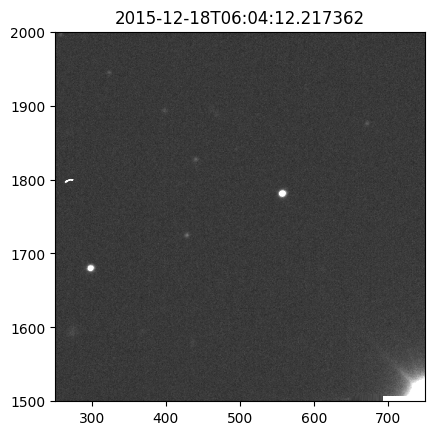

d904d4f514304d4f048be5ce85bf2c47_c4d_151218_060609_ooi_g_v1.fits.fz 31


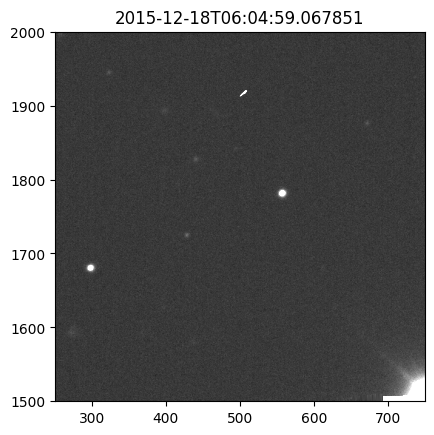

054934c394a7e0349352f660bfe1802b_c4d_151218_060655_ooi_g_v1.fits.fz 32


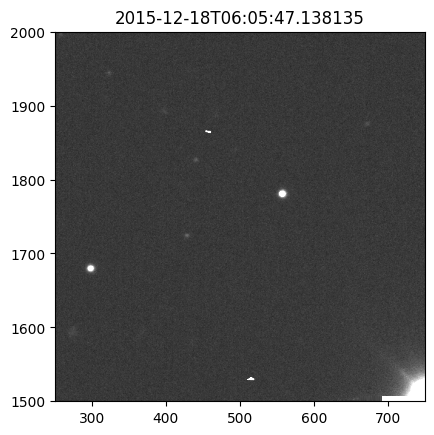

a58663caadc8b97bfaf4df72ed40e359_c4d_151218_060746_ooi_g_v1.fits.fz 33


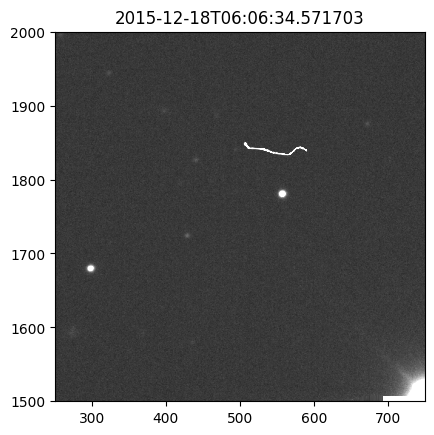

7ef731f77677d0bc75720d46628965ea_c4d_151218_060834_ooi_g_v1.fits.fz 34


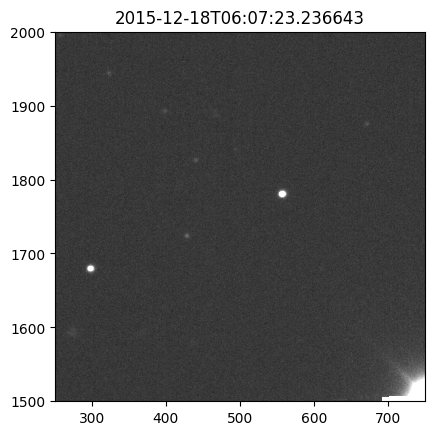

72804a00ade9048948bec579a6c1ba3b_c4d_151218_060925_ooi_g_v1.fits.fz 35


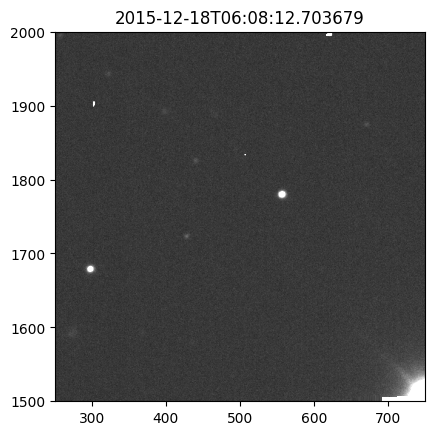

01f29585b8ab98b9445263645de2b759_c4d_151218_061011_ooi_g_v1.fits.fz 36


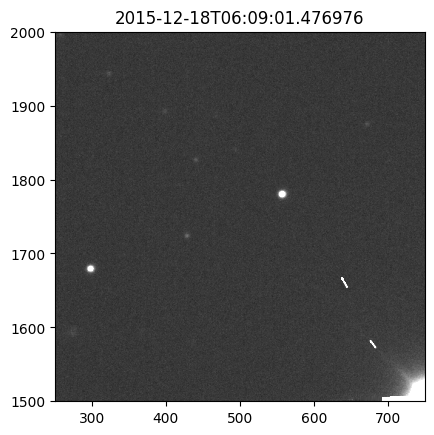

9719d5936f044286414621fffbf331a8_c4d_151218_061057_ooi_g_v1.fits.fz 37


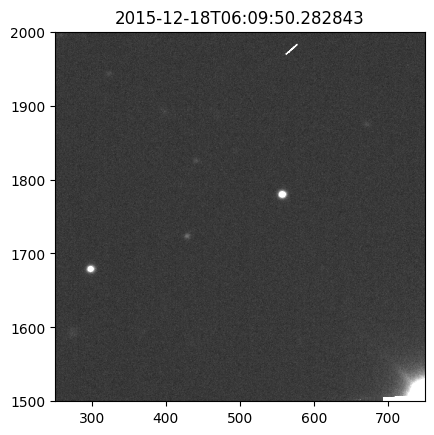

489f990fd94eb9cff4b14219e98b6bde_c4d_151218_061146_ooi_g_v1.fits.fz 38


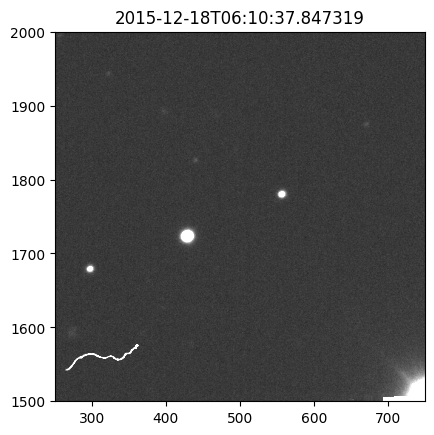

b4fd011a982f3ea4a2d00f14bb454f12_c4d_151218_061233_ooi_g_v1.fits.fz 39


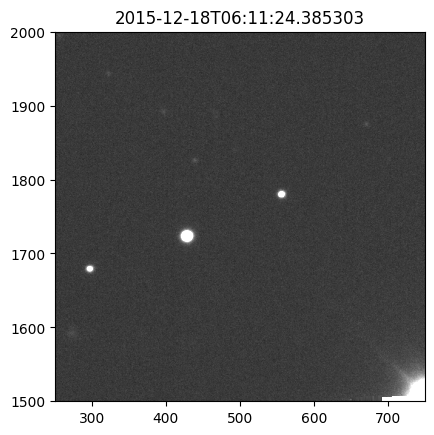

In [9]:
for i, imname in enumerate(imnames_timeordered[30:40]):

    image_data = fits.getdata('/Users/riley/Desktop/RAFTS/dwfflare/' + imname, ext=16)
    image_header = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/' + imname, ext=0)

    plt.imshow(np.rot90(image_data), cmap='gray', clim=(0,100))
    plt.title(image_header['DATE-OBS'])
    print(imname, i+30)
    plt.gca().invert_yaxis()
    #plt.gca().invert_xaxis()
    plt.xlim(250,750)
    plt.ylim(1500,2000)
    plt.show()

## Orientation

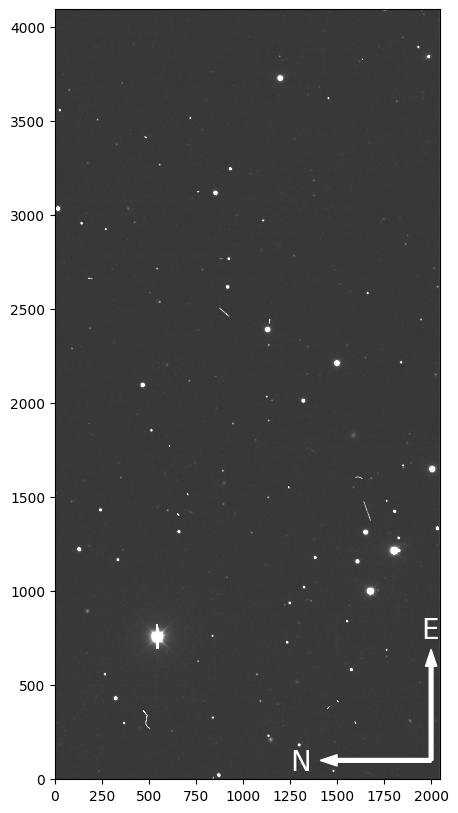

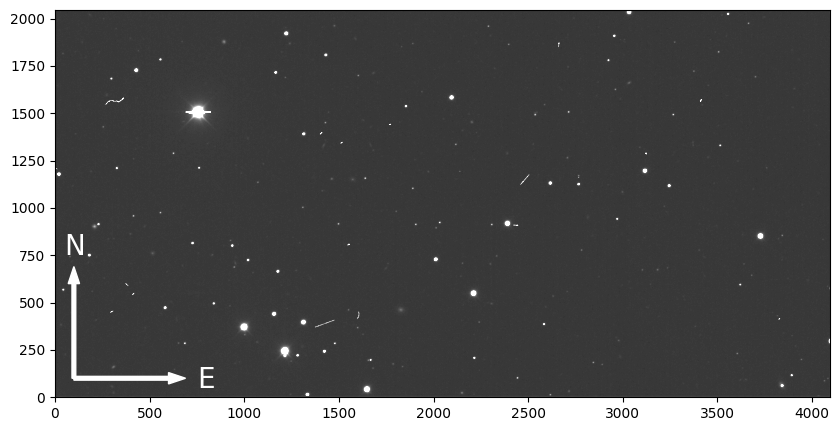

In [10]:
from scipy.ndimage import rotate

name = '489f990fd94eb9cff4b14219e98b6bde_c4d_151218_061146_ooi_g_v1_S18.fits.fz'
file = '/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + name

flare_data = fits.getdata('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + name)
flare_header = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + name)

fig = plt.figure(figsize=(10,10))
ax = plt.subplot()
ax.imshow(rotate(flare_data, angle=0), cmap='gray', clim=(0,100), origin='lower')
ax.arrow(x=2000, y=100, dx=0, dy=500, color='white', width=20)
ax.annotate("E", xy=(1950, 750), c='white', fontsize=20)

ax.arrow(x=2000, y=100, dx=-500, dy=0, color='white', width=20)
ax.annotate("N", xy=(1250, 50), c='white', fontsize=20)
fig.show()

fig = plt.figure(figsize=(10,10))
ax = plt.subplot()
ax.imshow(rotate(flare_data, angle=90), cmap='gray', clim=(0,100), origin='lower')
ax.arrow(x=100, y=100, dx=0, dy=500, color='white', width=20)
ax.annotate("N", xy=(50, 750), c='white', fontsize=20)

ax.arrow(x=100, y=100, dx=500, dy=0, color='white', width=20)
ax.annotate("E", xy=(750, 50), c='white', fontsize=20)
fig.show()

## Add date & time data to extension headers

In [11]:
def makefitsfromext(file, ext, outdir):
    hdu_list = fits.open(file)
    data = hdu_list[ext].data
    header = hdu_list[ext].header

    hdr = header
    hdr['DATE-OBS'] = hdu_list[0].header['DATE-OBS']

    empty_primary = fits.PrimaryHDU(header=hdr)

    image_hdu = fits.ImageHDU(data)

    hdul = fits.HDUList([empty_primary, image_hdu])

    hdul.writeto(outdir, overwrite=True)

In [12]:
for name in imnames_timeordered:

    makefitsfromext('/Users/riley/Desktop/RAFTS/dwfflare/' + name, ext=16, outdir='/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/'+ name[:-8] + '_S18.fits.fz')

## Run Sextractor on pre-flare image

Making SExtractor catalog of /Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/9719d5936f044286414621fffbf331a8_c4d_151218_061057_ooi_g_v1_S18.fits.fz...


> 
----- SExtractor 2.28.0 started on 2025-01-21 at 13:55:25 with 1 thread

> Setting catalog parameters
> Reading PSF information
> Preparing profile models
Fitting model: Sersic spheroid
> Reading detection filter
> Initializing Neural Network
> Reading Neural Network Weights
> Initializing check-image(s)
> Initializing catalog
> Looking for 9719d5936f044286414621fffbf331a8_c4d_151218_061057_ooi_g_v1_S18.fits.fz
----- Measuring from: 9719d5936f044286414621fffbf331a8_c4d_151218_061057_ooi_g_v1_S18.fits.fz [1/1]
      "Unnamed" / no ext. header / 2046x4094 / 32 bits (floats)
Detection+Measurement image: > Setting up background maps
> Setting up background map at line:   64
> Setting up background map at line:  128
> Setting up background map at line:  192
> Setting up background map at line:  256
> Setting up background map at line:  320
> Setting up background map at line:  384
> Setting up background map at line:  448
> Setting up background map at line:  512
> Setting up background 

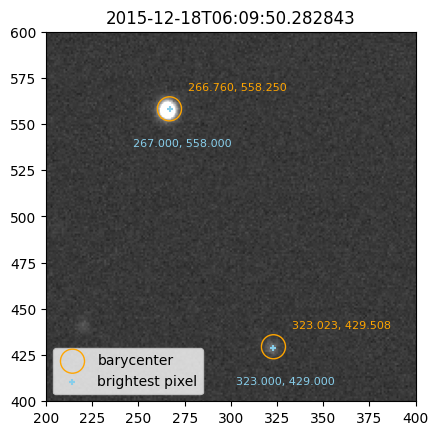

In [13]:
name = '9719d5936f044286414621fffbf331a8_c4d_151218_061057_ooi_g_v1_S18.fits.fz'

file = '/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + name
os.chdir('/Users/riley/Desktop/RAFTS/srcext')
print('Making SExtractor catalog of '+file+'...')
#print(os.path.isfile(file))
#print(os.getcwd())

os.system('sex ' + file + ' -c default.sex -DETECT_MINAREA 20 -DETECT_THRESH 5 -ANALYSIS_THRESH 5')

cata_quies = pd.read_table('out.cat', names=np.loadtxt('/Users/riley/Desktop/RAFTS/srcext/default.param', dtype=type(str)), index_col=0, comment='#', delim_whitespace=True)

os.chdir('/Users/riley/Desktop/RAFTS/Notebooks')

quies_data = fits.getdata(file)
quies_header = fits.getheader(file)
plt.imshow(quies_data, cmap='gray', clim=(0,100))
plt.scatter(cata_quies['X_IMAGE'], cata_quies['Y_IMAGE'], marker='o', s=300, facecolor='none', edgecolor='orange', label='barycenter')
plt.scatter(cata_quies['XPEAK_IMAGE'], cata_quies['YPEAK_IMAGE'], marker='+', s=20, color='skyblue', label='brightest pixel')
plt.title(quies_header['DATE-OBS'])
for i in range(len(cata_quies)):
    plt.annotate('{0:.3f}, {1:.3f}'.format(cata_quies['X_IMAGE'].values[i], cata_quies['Y_IMAGE'].values[i]), 
                 xy=(cata_quies['X_IMAGE'].values[i], cata_quies['Y_IMAGE'].values[i]), 
                 xytext=(cata_quies['X_IMAGE'].values[i] + 10, cata_quies['Y_IMAGE'].values[i] + 10), fontsize=8, color='orange')
    
    plt.annotate('{0:.3f}, {1:.3f}'.format(cata_quies['XPEAK_IMAGE'].values[i], cata_quies['YPEAK_IMAGE'].values[i]), 
                xy=(cata_quies['XPEAK_IMAGE'].values[i], cata_quies['YPEAK_IMAGE'].values[i]), 
                xytext=(cata_quies['XPEAK_IMAGE'].values[i]-20, cata_quies['YPEAK_IMAGE'].values[i]-20), fontsize=8, color='skyblue')
plt.xlim(200,400)
plt.ylim(400,600)
plt.legend(loc='lower left')

Let's convert pixel axes to world coordinate axes using WCS:

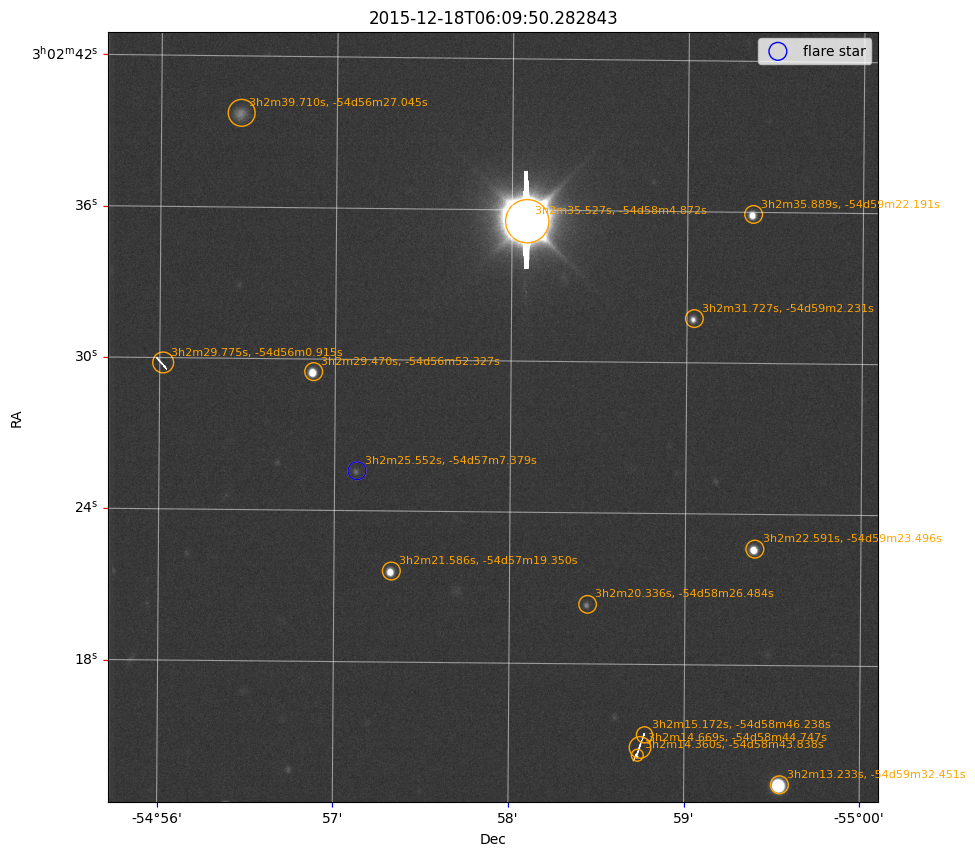

In [14]:
wcs = WCS(quies_header)

cata_quies['ALPHA_SKY'] = wcs.all_pix2world(cata_quies[['X_IMAGE', 'Y_IMAGE']].values, 1)[:,0]
cata_quies['DELTA_SKY'] = wcs.all_pix2world(cata_quies[['X_IMAGE', 'Y_IMAGE']].values, 1)[:,1]

fig = plt.figure(figsize=(10,10))
ax = plt.subplot(projection=wcs)
ax.imshow(quies_data, cmap='gray', clim=(0,100), origin='lower')
ax.scatter(cata_quies['X_IMAGE'], cata_quies['Y_IMAGE'], marker='o', s=50 * cata_quies['FLUX_RADIUS'], facecolor='none', edgecolor='orange')
ax.scatter(cata_quies['X_IMAGE'].iloc[14], cata_quies['Y_IMAGE'].iloc[14], marker='o', s=50 * cata_quies['FLUX_RADIUS'].iloc[20], facecolor='none', edgecolor='blue', label = 'flare star')
ax.set_title(quies_header['DATE-OBS'])
for i in range(len(cata_quies)):
    c = SkyCoord(ra = cata_quies['ALPHA_SKY'].values[i], dec = cata_quies['DELTA_SKY'].values[i], unit = u.deg)
    ax.annotate('{0:.0f}h{1:.0f}m{2:.3f}s, {3:.0f}d{4:.0f}m{5:.3f}s'.format(c.ra.hms.h, c.ra.hms.m, c.ra.hms.s, c.dec.dms.d, abs(c.dec.dms.m), abs(c.dec.dms.s)), 
                 xy=(cata_quies['X_IMAGE'].values[i], cata_quies['Y_IMAGE'].values[i]), 
                 xytext=(cata_quies['X_IMAGE'].values[i] + 10, cata_quies['Y_IMAGE'].values[i] + 10), fontsize=8, color='orange')
    
lon, lat = ax.coords
lon.set_ticks(color='red')
lon.set_ticks_position('lb')
lon.set_ticklabel_position('lb')
lat.set_ticks(color='blue')
lat.set_ticks_position('lb')
lat.set_ticklabel_position('lb')

ax.coords.grid(color='white', alpha=0.5, linestyle='solid')

plt.xlim(0,1000)
plt.ylim(0,1000)
plt.legend()

ax.coords[0].set_axislabel('Dec')
ax.coords[1].set_axislabel('RA')

In [15]:
cata_quies['ALPHA_SKY'].iloc[14], cata_quies['DELTA_SKY'].iloc[14]

(45.60646844625248, -54.95204967419421)

Where's the zenith in RADec?

In [16]:
mtn = EarthLocation.of_site('Cerro Tololo')
mjd = Time(quies_header['DATE-OBS'], format='fits')

zenith = SkyCoord(AltAz(alt=90 * u.degree, az=0 * u.degree, obstime = mjd, location=mtn)).transform_to(ICRS())
zenith

<SkyCoord (ICRS): (ra, dec) in deg
    (108.02771089, -30.13625597)>

## Run Sextractor on peak flare image

Making SExtractor catalog of /Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/489f990fd94eb9cff4b14219e98b6bde_c4d_151218_061146_ooi_g_v1_S18.fits.fz...


> 
----- SExtractor 2.28.0 started on 2025-01-21 at 13:55:36 with 1 thread

> Setting catalog parameters
> Reading PSF information
> Preparing profile models
Fitting model: Sersic spheroid
> Reading detection filter
> Initializing Neural Network
> Reading Neural Network Weights
> Initializing check-image(s)
> Initializing catalog
> Looking for 489f990fd94eb9cff4b14219e98b6bde_c4d_151218_061146_ooi_g_v1_S18.fits.fz
----- Measuring from: 489f990fd94eb9cff4b14219e98b6bde_c4d_151218_061146_ooi_g_v1_S18.fits.fz [1/1]
      "Unnamed" / no ext. header / 2046x4094 / 32 bits (floats)
Detection+Measurement image: > Setting up background maps
> Setting up background map at line:   64
> Setting up background map at line:  128
> Setting up background map at line:  192
> Setting up background map at line:  256
> Setting up background map at line:  320
> Setting up background map at line:  384
> Setting up background map at line:  448
> Setting up background map at line:  512
> Setting up background 

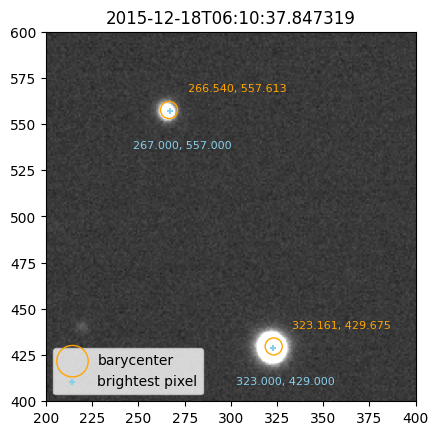

In [17]:
name = '489f990fd94eb9cff4b14219e98b6bde_c4d_151218_061146_ooi_g_v1_S18.fits.fz'

file = '/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + name
os.chdir('/Users/riley/Desktop/RAFTS/srcext')
print('Making SExtractor catalog of '+file+'...')
#print(os.path.isfile(file))
#print(os.getcwd())

os.system('sex ' + file + ' -c default.sex -DETECT_MINAREA 20 -DETECT_THRESH 5 -ANALYSIS_THRESH 5')

cata_flare = pd.read_table('out.cat', names=np.loadtxt('/Users/riley/Desktop/RAFTS/srcext/default.param', dtype=type(str)), index_col=0, comment='#', delim_whitespace=True)

os.chdir('/Users/riley/Desktop/RAFTS/Notebooks')

flare_data = fits.getdata('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + name)
flare_header = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + name)
plt.imshow(flare_data, cmap='gray', clim=(0,100), origin='lower')
plt.scatter(cata_flare['X_IMAGE'], cata_flare['Y_IMAGE'], marker='o', s=50 * cata_flare['FLUX_RADIUS'], facecolor='none', edgecolor='orange', label='barycenter')
plt.scatter(cata_flare['XPEAK_IMAGE'], cata_flare['YPEAK_IMAGE'], marker='+', s=20, color='skyblue', label='brightest pixel')
for i in range(len(cata_flare)):
    plt.annotate('{0:.3f}, {1:.3f}'.format(cata_flare['X_IMAGE'].values[i], cata_flare['Y_IMAGE'].values[i]), 
                 xy=(cata_flare['X_IMAGE'].values[i], cata_flare['Y_IMAGE'].values[i]), 
                 xytext=(cata_flare['X_IMAGE'].values[i] + 10, cata_flare['Y_IMAGE'].values[i] + 10), fontsize=8, color='orange')
    
    plt.annotate('{0:.3f}, {1:.3f}'.format(cata_flare['XPEAK_IMAGE'].values[i], cata_flare['YPEAK_IMAGE'].values[i]), 
                xy=(cata_flare['XPEAK_IMAGE'].values[i], cata_flare['YPEAK_IMAGE'].values[i]), 
                xytext=(cata_flare['XPEAK_IMAGE'].values[i]-20, cata_flare['YPEAK_IMAGE'].values[i]-20), fontsize=8, color='skyblue')
    
plt.title(flare_header['DATE-OBS'])
plt.xlim(200,400)
plt.ylim(400,600)
plt.legend(loc='lower left')

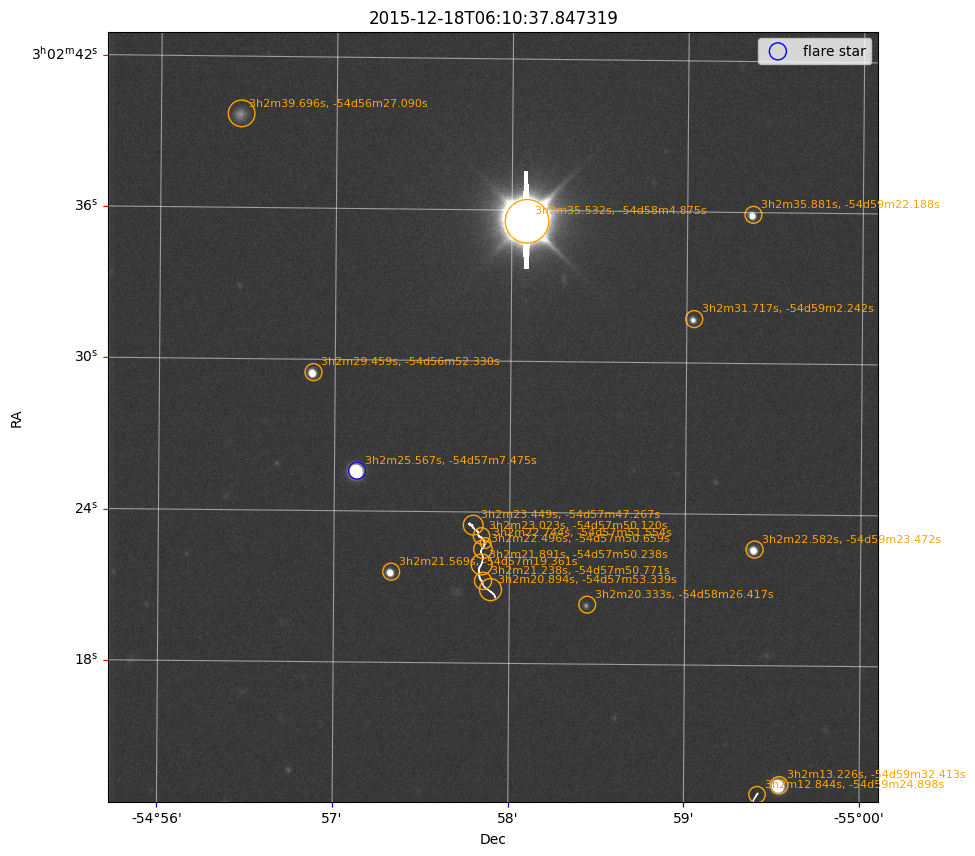

In [18]:
wcs = WCS(flare_header)

cata_flare['ALPHA_SKY'] = wcs.all_pix2world(cata_flare[['X_IMAGE', 'Y_IMAGE']].values, 1)[:,0]
cata_flare['DELTA_SKY'] = wcs.all_pix2world(cata_flare[['X_IMAGE', 'Y_IMAGE']].values, 1)[:,1]

fig = plt.figure(figsize=(10,10))
ax = plt.subplot(projection=wcs)
ax.imshow(flare_data, cmap='gray', clim=(0,100), origin='lower')
ax.scatter(cata_flare['X_IMAGE'], cata_flare['Y_IMAGE'], marker='o', s=50 * cata_flare['FLUX_RADIUS'], facecolor='none', edgecolor='orange')
ax.scatter(cata_flare['X_IMAGE'].iloc[20], cata_flare['Y_IMAGE'].iloc[20], marker='o', s=50 * cata_flare['FLUX_RADIUS'].iloc[20], facecolor='none', edgecolor='blue', label = 'flare star')
ax.set_title(flare_header['DATE-OBS'])
for i in range(len(cata_flare)):
    c = SkyCoord(ra = cata_flare['ALPHA_SKY'].values[i], dec = cata_flare['DELTA_SKY'].values[i], unit = u.deg)
    ax.annotate('{0:.0f}h{1:.0f}m{2:.3f}s, {3:.0f}d{4:.0f}m{5:.3f}s'.format(c.ra.hms.h, c.ra.hms.m, c.ra.hms.s, c.dec.dms.d, abs(c.dec.dms.m), abs(c.dec.dms.s)), 
                 xy=(cata_flare['X_IMAGE'].values[i], cata_flare['Y_IMAGE'].values[i]), 
                 xytext=(cata_flare['X_IMAGE'].values[i] + 10, cata_flare['Y_IMAGE'].values[i] + 10), fontsize=8, color='orange')
    
lon, lat = ax.coords
lon.set_ticks(color='red')
lon.set_ticks_position('lb')
lon.set_ticklabel_position('lb')
lat.set_ticks(color='blue')
lat.set_ticks_position('ub')
lat.set_ticklabel_position('ub')

ax.coords.grid(color='white', alpha=0.5, linestyle='solid')

plt.xlim(0,1000)
plt.ylim(0,1000)
plt.legend()

ax.coords[0].set_axislabel('Dec')
ax.coords[1].set_axislabel('RA')

Which row in the catalogs corresponds to the flare star?

In [19]:
np.where(np.abs(cata_quies['X_IMAGE'] - 323) == np.abs(cata_quies['X_IMAGE'] - 323).min())

(array([14]),)

In [20]:
np.where(np.abs(cata_flare['X_IMAGE'] - 323) == np.abs(cata_flare['X_IMAGE'] - 323).min())

(array([20]),)

In [21]:
cata_quies.iloc[14]

X_IMAGE          323.023000
Y_IMAGE          429.508300
XPEAK_IMAGE      323.000000
YPEAK_IMAGE      429.000000
XWIN_IMAGE       323.126700
YWIN_IMAGE       429.752800
XMODEL_IMAGE     323.101300
YMODEL_IMAGE     429.727400
XMAX_IMAGE       325.000000
YMAX_IMAGE       432.000000
XMIN_IMAGE       321.000000
YMIN_IMAGE       427.000000
FLUX_AUTO       1099.056000
FLUX_MODEL      1102.602000
FLUX_APER        367.408800
MAG_AUTO          -7.602500
MAGERR_AUTO        0.039400
MAG_MODEL         -7.606000
MAG_APER          -6.412900
FLUX_RADIUS        3.312000
FLAGS              0.000000
NITER_MODEL       26.000000
ALPHA_SKY         45.606468
DELTA_SKY        -54.952050
THETA_WORLD      -66.580000
ELLIPTICITY        0.126000
EXT_NUMBER         1.000000
CLASS_STAR         0.000000
Name: 15, dtype: float64

In [22]:
cata_flare.iloc[20]

X_IMAGE            323.161500
Y_IMAGE            429.674900
XPEAK_IMAGE        323.000000
YPEAK_IMAGE        429.000000
XWIN_IMAGE         323.183500
YWIN_IMAGE         429.527300
XMODEL_IMAGE       323.161400
YMODEL_IMAGE       429.594800
XMAX_IMAGE         335.000000
YMAX_IMAGE         441.000000
XMIN_IMAGE         311.000000
YMIN_IMAGE         418.000000
FLUX_AUTO       193343.500000
FLUX_MODEL      192558.100000
FLUX_APER        75351.660000
MAG_AUTO           -13.215800
MAGERR_AUTO          0.000300
MAG_MODEL          -13.211400
MAG_APER           -12.192700
FLUX_RADIUS          3.004000
FLAGS                0.000000
NITER_MODEL         69.000000
ALPHA_SKY           45.606527
DELTA_SKY          -54.952076
THETA_WORLD        -72.460000
ELLIPTICITY          0.072000
EXT_NUMBER           1.000000
CLASS_STAR           0.693000
Name: 21, dtype: float64

## Comparing flare $d_{\parallel}$ to reference stars

In [23]:
###IMAGE RANGE SELECTION
start = 8
end = 82

In [24]:
#BUILD CATALOGS

rebuild = False

if rebuild:

    for i, imname in enumerate(imnames_timeordered[start:end]):

        imname = imname[:-8] + '_S18' + imname[-8:]
        
        file = '/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname 
        data = fits.getdata('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname)
        header = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname)
        
        os.chdir('/Users/riley/Desktop/RAFTS/srcext')
        print('Making SExtractor catalog of '+file+'...')
        os.system('sex ' + file + ' -c default.sex -CATALOG_NAME out_{0}.cat -DETECT_MINAREA 40 -DETECT_THRESH 1 -ANALYSIS_THRESH 2.5 -PIXEL_SCALE 0.263 -SEEING_FWHM {1} -VERBOSE_TYPE QUIET'.format(i, header['FWHM']))

        cata = pd.read_table('out_{}.cat'.format(i), names=np.loadtxt('/Users/riley/Desktop/RAFTS/srcext/default.param', dtype=type(str)), index_col=0, comment='#', delim_whitespace=True)

        os.chdir('/Users/riley/Desktop/RAFTS/Notebooks')

Let's look at the first 10 chips and ID sources with high CLASS_STAR scores

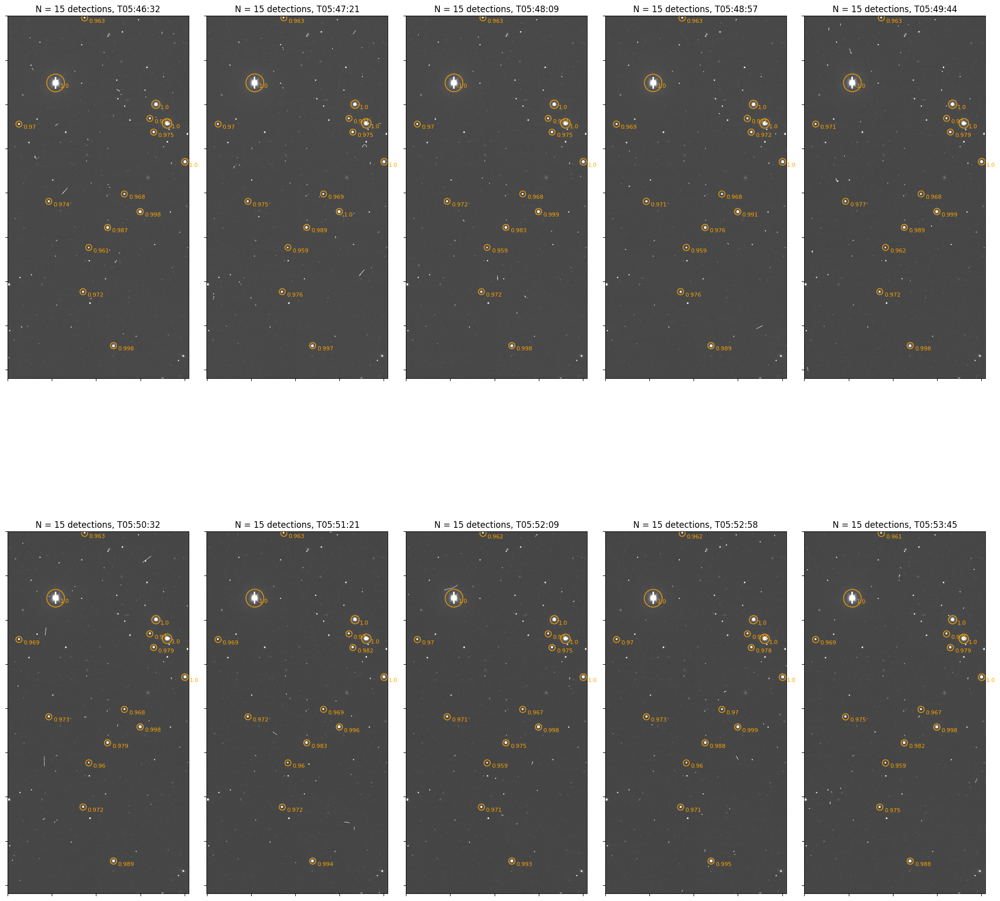

In [25]:
fig, ax = plt.subplots(2,5, figsize=(20,20))
fig.tight_layout()
plt.subplots_adjust(wspace=0.1, 
                    hspace=0.1)

for i, imname in enumerate(imnames_timeordered[start:start+10]):
    imname = imname[:-8] + '_S18' + imname[-8:]
    
    file = '/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname 
    data = fits.getdata('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname)
    header = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname)

    cata = pd.read_table('/Users/riley/Desktop/RAFTS/srcext/out_{}.cat'.format(i), names=np.loadtxt('/Users/riley/Desktop/RAFTS/srcext/default.param', dtype=type(str)), index_col=0, comment='#', delim_whitespace=True)

    ax.flatten()[i].imshow(data, cmap='Greys_r', clim=(0,100))
    ax.flatten()[i].set_yticklabels([])
    ax.flatten()[i].set_xticklabels([])

    cs_thr = 0.95
    cond = (cata['FLAGS'] == 0) * (cata['CLASS_STAR'] > cs_thr)

    ax.flatten()[i].set_title('N = {0} detections, {1}'.format(len(cata.where(cond).dropna()), header['DATE-OBS'][10:-7]))

    ax.flatten()[i].scatter(cata['X_IMAGE'].where(cond), cata['Y_IMAGE'].where(cond), 
            marker='o', s=30 * cata['FLUX_RADIUS'].where(cond), facecolor='none', edgecolor='orange')
    
    for j in range(cata.shape[0]):
        ax.flatten()[i].annotate('{}'.format(cata['CLASS_STAR'].where(cond).values[j]), 
                                 xy=(cata['X_IMAGE'].where(cond).values[j], cata['Y_IMAGE'].where(cond).values[j]), 
                                 xytext=(cata['X_IMAGE'].where(cond).values[j] + 50, cata['Y_IMAGE'].where(cond).values[j] + 50), 
                                 fontsize=8, color='orange')
        
plt.savefig('/Users/riley/Desktop/RAFTS/Figures/decam_grid.png', dpi=400, bbox_inches='tight')

Now let's define reference stars and track their motion relative to their starting position over the entire observing period

In [26]:
#flare_ref_pos = cata[['X_IMAGE', 'Y_IMAGE']].iloc[np.where(np.sqrt( (cata['X_IMAGE'].values - 323)**2 + (cata['Y_IMAGE'].values - 429)**2 ) == 
#                                                  np.sqrt( (cata['X_IMAGE'].values - 323)**2 + (cata['Y_IMAGE'].values - 429)**2 ).min())[0]]
flare_ref_pos = np.array([323.0, 429.5]).reshape(1,2)
flare_ref_pos

array([[323. , 429.5]])

In [27]:
##Mean seeing

seeing = []

for i, imname in enumerate(imnames_timeordered[start:end]):
    
    header_0 = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/' + imname)
    imname = imname[:-8] + '_S18' + imname[-8:]
    file = '/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname 
    data = fits.getdata('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname)
    header = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname)
    
    seeing.append(header['FWHM'] * 0.263)

np.mean(seeing)

1.338569530445946

In [28]:
##Make data cube with dimension (star, coordinate, time) 
n_stars = 14
ref_cube = np.zeros((n_stars+1, 2, end - start))
times = []
mags = np.zeros(end - start)
magerrs = np.zeros(end - start)
ref_cube_xy = np.zeros_like(ref_cube)

for i, imname in enumerate(imnames_timeordered[start:end]):
    
    header_0 = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/' + imname)
    imname = imname[:-8] + '_S18' + imname[-8:]
    file = '/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname 
    data = fits.getdata('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname)
    header = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname)
    wcs = WCS(header)
    time = Time(header['DATE-OBS'])
    times.append(time)
 
    loc = EarthLocation.of_site('Cerro Tololo')

    cata = pd.read_table('/Users/riley/Desktop/RAFTS/srcext/out_{}.cat'.format(i), 
                         names=np.loadtxt('/Users/riley/Desktop/RAFTS/srcext/default.param', dtype=type(str)), 
                         index_col=0, comment='#', delim_whitespace=True)
    
    cs_thr = 0.6
    cond = (cata['FLAGS'] == 0) * (cata['CLASS_STAR'] > cs_thr) * \
           (cata['FLUX_AUTO'] != cata['FLUX_AUTO'].max()) 

    #Select reference stars
    if i == 0:
        ref_pos = cata[['X_IMAGE', 'Y_IMAGE']].where(cond).dropna().values
        closest_n = np.argsort(np.sqrt( (ref_pos[:,0] - flare_ref_pos[0][0])**2 + (ref_pos[:,1] - flare_ref_pos[0][1])**2 ) )[:n_stars]
        ref_pos = np.concatenate((flare_ref_pos, ref_pos[closest_n]))

    else:
        pass

    cata['ALPHA_SKY'] = wcs.all_pix2world(cata[['X_IMAGE', 'Y_IMAGE']].values, 1)[:,0]
    cata['DELTA_SKY'] = wcs.all_pix2world(cata[['X_IMAGE', 'Y_IMAGE']].values, 1)[:,1]

    inds = []
    for ref in ref_pos:
        inds.append(np.where(np.sqrt( (cata['X_IMAGE'].values - ref[0])**2 + (cata['Y_IMAGE'].values - ref[1])**2 ) == 
                             np.sqrt( (cata['X_IMAGE'].values - ref[0])**2 + (cata['Y_IMAGE'].values - ref[1])**2 ).min())[0][0])

    ref_cube[:,:,i] = cata[['ALPHA_SKY', 'DELTA_SKY']].iloc[inds].values
    ref_cube_xy[:,:,i] = cata[['X_IMAGE', 'Y_IMAGE']].iloc[inds].values

    #Make lightcurve
    mags[i] = (cata['MAG_AUTO'].iloc[inds].values[0])
    magerrs[i] = (cata['MAGERR_AUTO'].iloc[inds].values[0])

    ##PLOTTING
    fig, (ax1, ax2) = plt.subplots(ncols=1, nrows=2, subplot_kw={'projection': wcs}, figsize=(10,10))
    window = [(300,350), (450,400)]

    ax1.imshow(data, cmap='Greys_r', clim=(0,100))
    ax1.scatter(cata['X_IMAGE'].iloc[inds[0]] - 1, cata['Y_IMAGE'].iloc[inds[0]] - 1, color='red', marker='+', label='detected position (flare star)')
    ax1.scatter(cata['X_IMAGE'].iloc[inds[1:]].values - 1, cata['Y_IMAGE'].iloc[inds[1:]].values - 1, color='orange', marker='+', label='detected position')
    ax1.scatter(ref_pos[:,0] - 1, ref_pos[:,1] - 1, s=100, facecolor='none', edgecolor='blue', marker='o', label='reference position')
    ax1.annotate("0", xy=(cata['X_IMAGE'].iloc[inds[0]] + 30, cata['Y_IMAGE'].iloc[inds[0]] + 30), c='red', fontsize=10)
    for j, ind in enumerate(inds[1:]):
        ax1.annotate("{}".format(j+1), xy=(cata['X_IMAGE'].iloc[ind] + 30, cata['Y_IMAGE'].iloc[ind] + 30), c='orange', fontsize=10)

    ax1.set_ylim(2000,0)
    ax1.set_title('Image {0}, {1}'.format(i, time))
    ax1.legend(loc='lower left')

    lon, lat = ax1.coords
    lon.set_ticks()
    lon.set_ticks_position('lb')
    lon.set_ticklabel_position('lb')
    lon.set_axislabel('Dec (dms)')
    lat.set_ticks()
    lat.set_ticks_position('lb')
    lat.set_ticklabel_position('lb')
    lat.set_axislabel('RA (hms)', minpad=-0.4)
    

    ax2.imshow(data, cmap='Greys_r', clim=(0,100))
    ax2.scatter(cata['X_IMAGE'].iloc[inds].values - 1, cata['Y_IMAGE'].iloc[inds].values - 1, color='red', marker='+', label='detected position')
    ax2.scatter(ref_pos[:,0] - 1, ref_pos[:,1] - 1, s=100, facecolor='none', edgecolor='blue', marker='o', label='reference position')
    ax2.vlines([cata['XMIN_IMAGE'].iloc[inds].values[0] - 1, cata['XMAX_IMAGE'].iloc[inds].values[0] - 1], 
                    cata['YMIN_IMAGE'].iloc[inds].values[0] - 1, cata['YMAX_IMAGE'].iloc[inds].values[0] - 1, color='red')
    ax2.hlines([cata['YMIN_IMAGE'].iloc[inds].values[0] - 1, cata['YMAX_IMAGE'].iloc[inds].values[0] - 1], 
                    cata['XMIN_IMAGE'].iloc[inds].values[0] - 1, cata['XMAX_IMAGE'].iloc[inds].values[0] - 1, color='red')
    ax2.set_xlim(window[0][0], window[0][1])
    ax2.set_ylim(window[1][0], window[1][1])
    #ax2.set_title('MAG_AUTO = {}'.format(cata['MAG_AUTO'].iloc[inds].values[0]) + r'$\pm$' + '{}'.format(cata['MAGERR_AUTO'].iloc[inds].values[0]))

    lon, lat = ax2.coords
    lon.set_ticks()
    lon.set_ticks_position('lb')
    lon.set_ticklabel_position('lb')
    lon.set_axislabel('Dec (dms)')
    lat.set_ticks()
    lat.set_ticks_position('lb')
    lat.set_ticklabel_position('lb')
    lat.set_axislabel('RA (hms)', minpad=-0.4)

    '''
    lon, lat = ax2.coords
    lon.set_ticks()
    lon.set_ticks_position('rb')
    lon.set_ticklabel_position('rb')
    lon.set_axislabel('Dec (dms)')
    lat.set_ticks()
    lat.set_ticks_position('ub')
    lat.set_ticklabel_position('ub')
    lat.set_axislabel('RA (hms)')
    lat.set_axislabel_position('r')
    '''

    #if i == 0:
    #    plt.show()

    plt.savefig('/Users/riley/Desktop/RAFTS/Figures/dwf_gif/dwf_gif{}.png'.format(i), bbox_inches='tight')
    plt.close()

In [29]:
ref_cube.shape

(15, 2, 74)

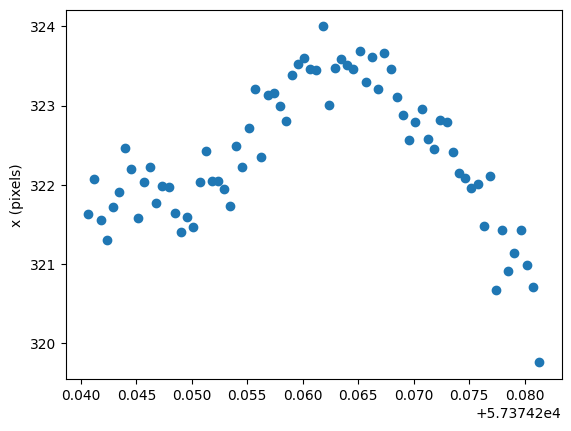

In [30]:
plt.scatter([time.mjd for time in times], ref_cube_xy[0,0,:])
plt.ylabel('x (pixels)');

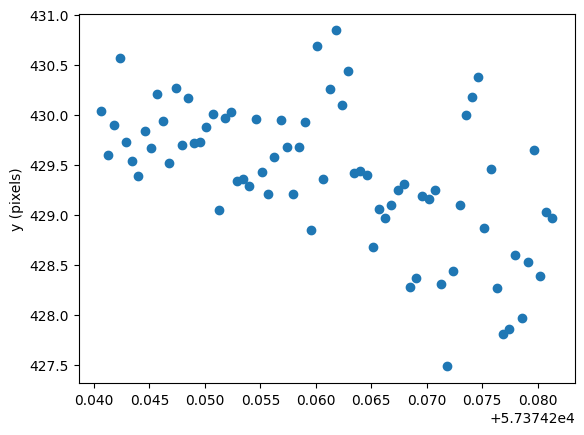

In [31]:
plt.scatter([time.mjd for time in times], ref_cube_xy[0,1,:])
plt.ylabel('y (pixels)');

In [32]:
shift_cube_xy = np.full_like(ref_cube_xy, np.nan)

for t in range(ref_cube_xy.shape[2]):
    shift_cube_xy[:,:,t] = ref_cube_xy[:,:,t] - ref_cube_xy[:,:,0]

print(shift_cube_xy.shape)
res = shift_cube_xy[np.invert((shift_cube_xy > 10).sum(2).sum(1) > 0)]
print(res.shape)

(15, 2, 74)
(15, 2, 74)


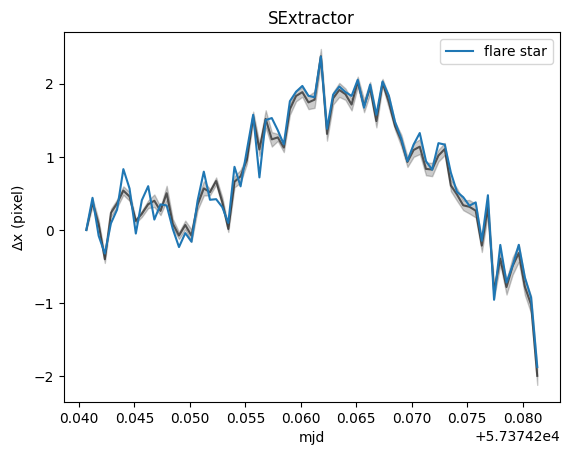

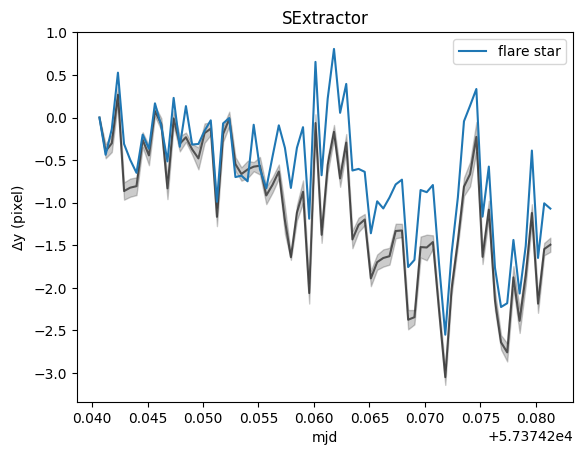

In [33]:
shift_cube_xy = np.full_like(ref_cube_xy, np.nan)

for t in range(ref_cube_xy.shape[2]):
    shift_cube_xy[:,:,t] = ref_cube_xy[:,:,t] - ref_cube_xy[:,:,0]

shift_cube_xy = shift_cube_xy[np.invert((shift_cube_xy > 10).sum(2).sum(1) > 0)]

plt.plot([time.mjd for time in times], shift_cube_xy[1:,0,:].mean(axis=0), color='k', alpha=0.6)
plt.fill_between([time.mjd for time in times], 
                 shift_cube_xy[1:,0,:].mean(axis=0) - shift_cube_xy[1:,0,:].std(axis=0),
                 shift_cube_xy[1:,0,:].mean(axis=0) + shift_cube_xy[1:,0,:].std(axis=0), color='k', alpha=0.2)

plt.plot([time.mjd for time in times], shift_cube_xy[0,0,:], label='flare star')


plt.xlabel('mjd')
plt.ylabel(r'$\Delta$x (pixel)')
plt.title('Rubin diaForcedSource')
plt.title('SExtractor')
plt.legend()
plt.show()

plt.plot([time.mjd for time in times], shift_cube_xy[1:,1,:].mean(axis=0), color='k', alpha=0.6)
plt.fill_between([time.mjd for time in times], 
                 shift_cube_xy[1:,1,:].mean(axis=0) - shift_cube_xy[1:,1,:].std(axis=0),
                 shift_cube_xy[1:,1,:].mean(axis=0) + shift_cube_xy[1:,1,:].std(axis=0), color='k', alpha=0.2)

plt.plot([time.mjd for time in times], shift_cube_xy[0,1,:], label='flare star')

plt.xlabel('mjd')
plt.ylabel(r'$\Delta$y (pixel)')
plt.title('SExtractor')
plt.legend()
plt.show()

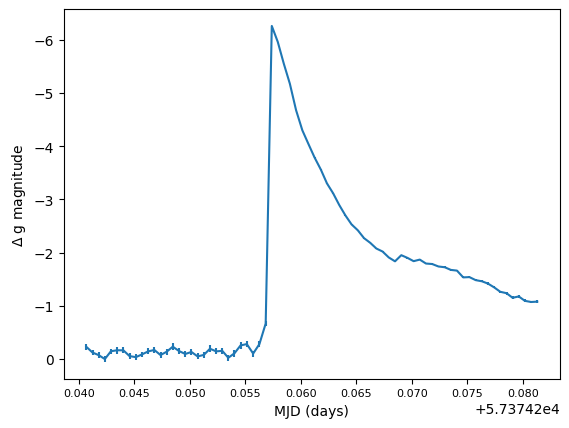

In [36]:
##LIGHTCURVE
plt.errorbar([time.mjd for time in times], mags - mags.max(), yerr=magerrs)
plt.tick_params(axis='x', labelsize=8)
plt.xlabel('MJD (days)')
plt.ylabel(r'$\Delta$ g magnitude')
plt.gca().invert_yaxis()

Use the data in ref_cube to calculate $d_{\parallel}$ for each star relative to its initial position at each time

In [37]:
ref_cube.shape

(15, 2, 74)

1 flare star + 14 reference stars, 2 coords (RA, Dec), 74 images

In [38]:
pa_arr = np.zeros((ref_cube.shape[0], ref_cube.shape[2]))

for i in range(ref_cube.shape[0]):
    for j in range(ref_cube.shape[2]):
        pa_arr[i][j] = celest_to_pa(ref_cube[i,0,j], ref_cube[i,1,j], time = times[j], loc = EarthLocation.of_site('Cerro Tololo'))

pa_arr.shape

(15, 74)

The parallactic angle array is created from pairs of coordinates in ref_cube

15 stars, 74 images

In [39]:
shift_cube = np.zeros_like(ref_cube)
for t in range(ref_cube.shape[2]):
    shift_cube[:,:,t] = ref_cube[:,:,t] - ref_cube[:,:,0]

shift_cube.shape

(15, 2, 74)

shift_cube is created by subtracting the coordinate pairs at $t_0$ from the other coordinate pairs along the time axis

15 stars, 2 pairs of delta coords (dRA, dDec), 74 images

In [40]:
dpar_arr = np.zeros((shift_cube.shape[0], shift_cube.shape[2]))

for s in range(shift_cube.shape[0]):
    for t in range(shift_cube.shape[2]):
            dpar_arr[s][t] = dpar(shift_cube[s,0,t], shift_cube[s,1,t], pa_arr[s,t])

dpar_arr[np.isnan(dpar_arr)] = 0
dpar_arr.shape

(15, 74)

$d_{\parallel}$ array combines delta coordinate pairs from shift_cube and parallactic angles from pa_arr

15 stars, 74 images

In [41]:
dtan_arr = np.zeros((shift_cube.shape[0], shift_cube.shape[2]))

for s in range(shift_cube.shape[0]):
    for t in range(shift_cube.shape[2]):
        dtan_arr[s][t] = dtan(shift_cube[s,0,t], shift_cube[s,1,t], pa_arr[s,t])

dtan_arr[np.isnan(dtan_arr)] = 0
dtan_arr.shape

(15, 74)

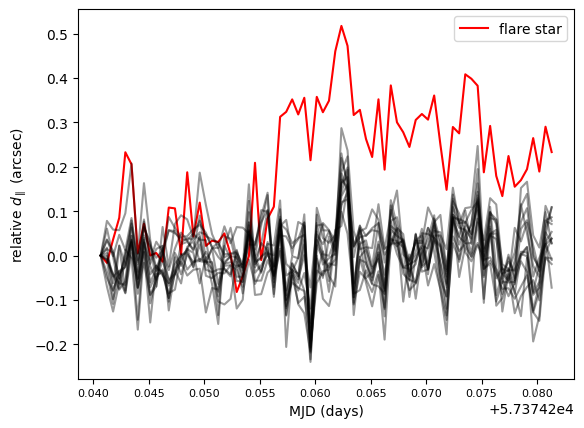

In [42]:
for p in range(dpar_arr.shape[0]):
    if p == 0:
        plt.plot([time.mjd for time in times], dpar_arr[p] * 3600, color='red', label='flare star')
    else:
        plt.plot([time.mjd for time in times], dpar_arr[p] * 3600, color='black', alpha=0.4)

plt.tick_params(axis='x', labelsize=8)
plt.xlabel('MJD (days)')
plt.ylabel(r'relative $d_{\parallel}$ (arcsec)')
plt.legend()


In [43]:
#Define per-epoch airmasses
amst = SkyCoord(ra = ref_cube[0,0,:], dec = ref_cube[0,1,:], 
         unit=u.deg, obstime=times, location=EarthLocation.of_site('Cerro Tololo')).transform_to(AltAz).secz.value

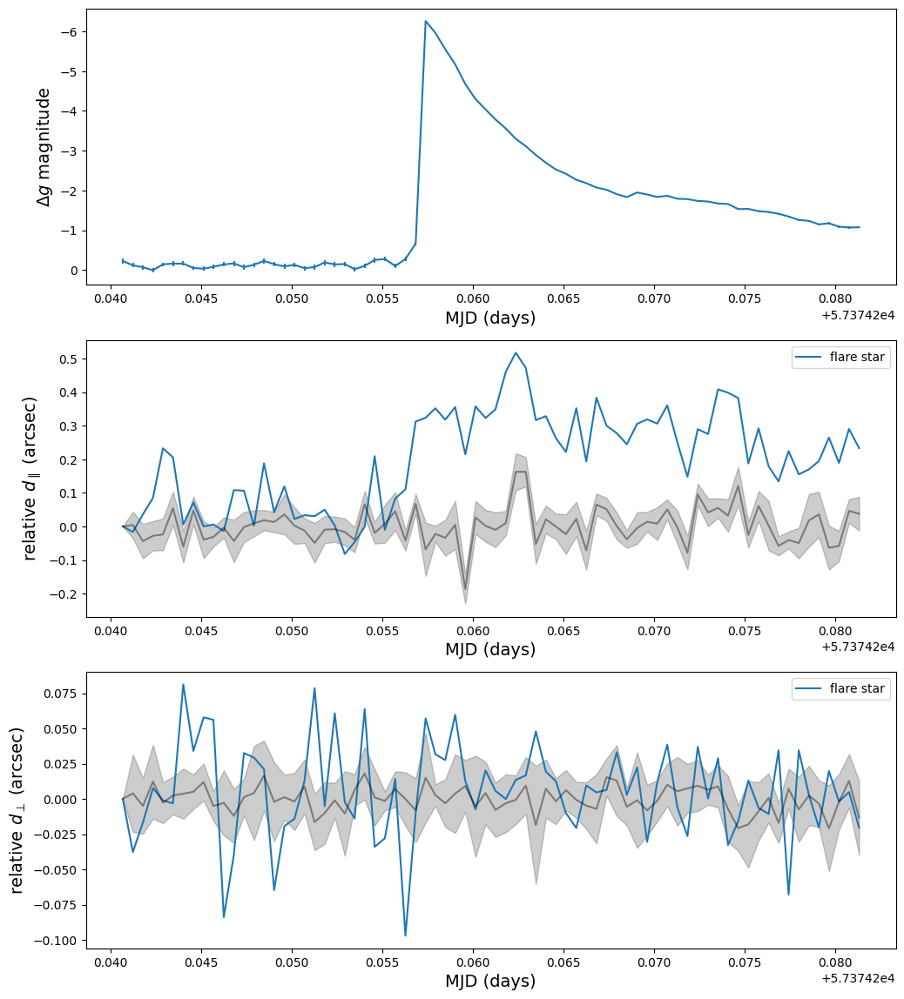

In [44]:
fig, axes = plt.subplots(3,1, figsize=(12,12))

ax = axes.flatten()

ax[0].errorbar([time.mjd for time in times], mags - mags.max(), yerr=magerrs)
ax[0].set_xlabel('MJD (days)', fontsize=14)
ax[0].set_ylabel(r'$\Delta g$ magnitude', fontsize=14)
ax[0].set_ylim(ax[0].get_ylim()[::-1])

ax[1].plot([time.mjd for time in times], dpar_arr[0] * 3600, label='flare star')
ax[1].plot([time.mjd for time in times], dpar_arr[1:].mean(axis=0) * 3600, color='black', alpha=0.4)

ax[1].fill_between([time.mjd for time in times], (dpar_arr[1:].mean(axis=0) - dpar_arr[1:].std(axis=0)) * 3600, 
                   (dpar_arr[1:].mean(axis=0) + dpar_arr[1:].std(axis=0)) * 3600, color='black', alpha=0.2)
ax[1].set_xlabel('MJD (days)', fontsize=14)
ax[1].set_ylabel(r'relative $d_{\parallel}$ (arcsec)', fontsize=14)
ax[1].legend()

ax[2].plot([time.mjd for time in times], dtan_arr[0] * 3600, label='flare star')
ax[2].plot([time.mjd for time in times], dtan_arr[1:].mean(axis=0) * 3600, color='black', alpha=0.4)

ax[2].fill_between([time.mjd for time in times], (dtan_arr[1:].mean(axis=0) - dtan_arr[1:].std(axis=0)) * 3600, 
                   (dtan_arr[1:].mean(axis=0) + dtan_arr[1:].std(axis=0)) * 3600, color='black', alpha=0.2)

ax[2].set_xlabel('MJD (days)', fontsize=14)
ax[2].set_ylabel(r'relative $d_{\perp}$ (arcsec)', fontsize=14)
ax[2].legend()

plt.subplots_adjust(bottom=0.05, top=0.95)

Generate simplest answer first: forward model t_eff curve with airmass/R grid, assume M5.5 template

More correct: model filling factor (i.e. solve for filling factor w t_eff) + flare visibility

How does flare energy compare to naive (BB) assumption?

Overlay temp curves from Howard et al. 

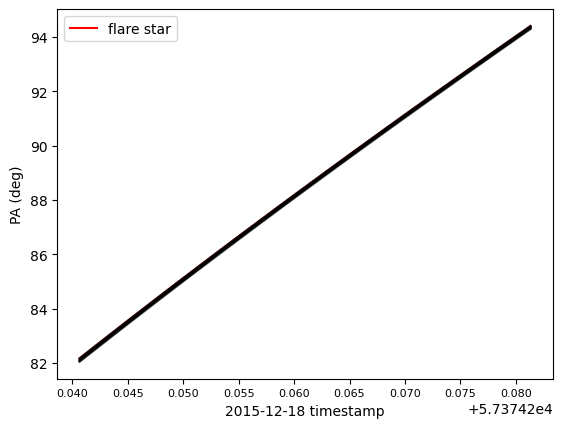

In [45]:
for p in range(pa_arr.shape[0]):
    if p == 0:
        plt.plot([time.mjd for time in times], pa_arr[p], color='red', label='flare star')
    else:
        plt.plot([time.mjd for time in times], pa_arr[p], color='black', alpha=0.4)

plt.tick_params(axis='x', labelsize=8)
plt.xlabel('{} timestamp'.format(times[0].value[:10]))
plt.ylabel('PA (deg)')
plt.legend()

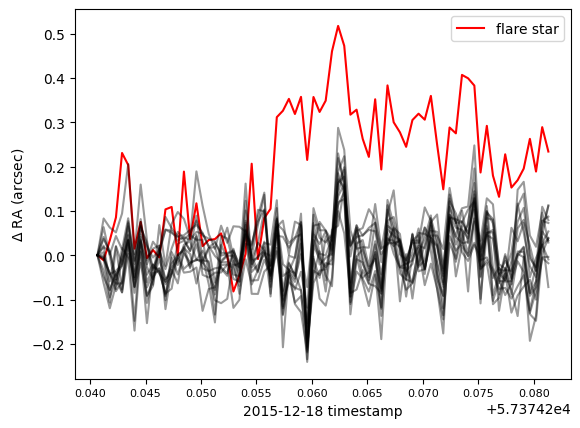

In [46]:
for p in range(shift_cube.shape[0]):
    if p == 0:
        plt.plot([time.mjd for time in times], shift_cube[p,0,:] * 3600, color='red', label='flare star')
    else:
        plt.plot([time.mjd for time in times], shift_cube[p,0,:] * 3600, color='black', alpha=0.4)

plt.tick_params(axis='x', labelsize=8)
plt.xlabel('{} timestamp'.format(times[0].value[:10]))
plt.ylabel(r'$\Delta$ RA (arcsec)')
plt.legend()

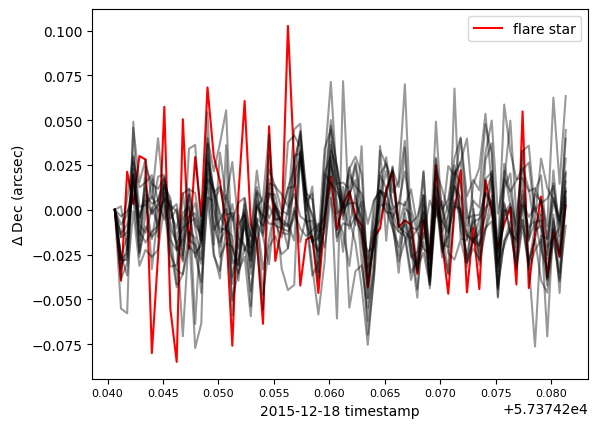

In [47]:
for p in range(shift_cube.shape[0]):
    if p == 0:
        plt.plot([time.mjd for time in times], shift_cube[p,1,:] * 3600, color='red', label='flare star')
    else:
        plt.plot([time.mjd for time in times], shift_cube[p,1,:] * 3600, color='black', alpha=0.4)

plt.tick_params(axis='x', labelsize=8)
#plt.vlines(3, -0.1, 0.1, ls='--', label=r'$t_{peak}$')
plt.xlabel('{} timestamp'.format(times[0].value[:10]))
plt.ylabel(r'$\Delta$ Dec (arcsec)')
plt.legend()

## Forward modeling $T_{eff}$

In [48]:
#generate grids
bins = 101
grid = np.zeros([bins,bins])
amrange = (1.05, 2.06)
temprange = (2800, 53300)
ams = np.arange(amrange[0], amrange[1], (amrange[1] - amrange[0]) / bins)
temps = np.arange(temprange[0], temprange[1], (temprange[1] - temprange[0]) / bins)

for i, am in enumerate(ams):
    for j, temp in enumerate(temps):
        w_eff1 = np.array(lamb_eff_md(band='g', temp=0.0))
        w_eff2 = np.array(lamb_eff_md(band='g', temp=temp))
        grid[i][j] = dcr_offset(w_eff2, airmass = am) - dcr_offset(w_eff1, airmass = am)

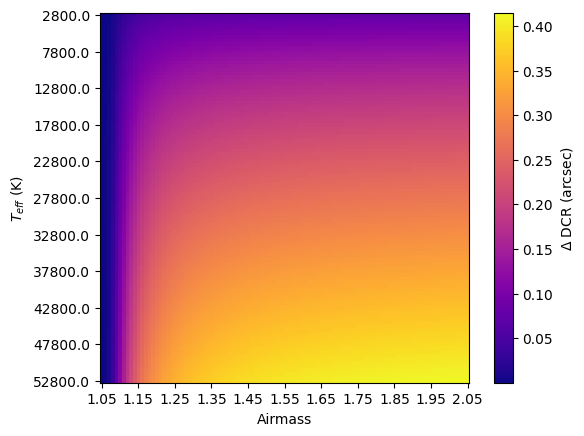

In [49]:
plt.imshow(grid, cmap='plasma')
plt.colorbar(label=r'$\Delta$ DCR (arcsec)')
plt.yticks(ticks=np.arange(0,110,10), labels = temps[::10])
plt.xticks(ticks=np.arange(0,110,10), labels = np.round(ams[::10], decimals=2));
plt.xlabel('Airmass')
plt.ylabel(r'$T_{eff}$ (K)');

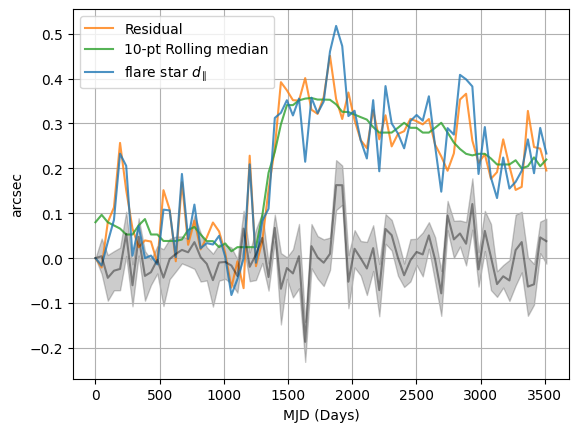

In [50]:
window = 10
dtime = [(time.mjd - times[0].mjd) * 3600 * 24 for time in times]
dpar_raw = (dpar_arr[0] - dpar_arr[1:].mean(axis=0)) * 3600

dpar_smooth = pd.Series((dpar_arr[0] - dpar_arr[1:].mean(axis=0)) * 3600).rolling(window, min_periods=1, center=True).median()

plt.plot(dtime, (dpar_arr[0] - dpar_arr[1:].mean(axis=0)) * 3600, color='C1', alpha=0.8, label='Residual')
plt.plot(dtime, dpar_smooth, label='{}-pt Rolling median'.format(window), color='C2', alpha=0.8)

plt.plot(dtime, dpar_arr[0] * 3600, label='flare star $d_{\parallel}$', alpha=0.8, color='C0')
plt.plot(dtime, dpar_arr[1:].mean(axis=0) * 3600, color='black', alpha=0.4)

plt.fill_between(dtime, (dpar_arr[1:].mean(axis=0) - dpar_arr[1:].std(axis=0)) * 3600, 
                   (dpar_arr[1:].mean(axis=0) + dpar_arr[1:].std(axis=0)) * 3600, color='black', alpha=0.2)

plt.xlabel('MJD (Days)')
plt.ylabel('arcsec')
plt.legend()
plt.grid()

np.save('/Users/Riley/Desktop/RAFTS/Outdata/dpar_sextractor', dpar_smooth)

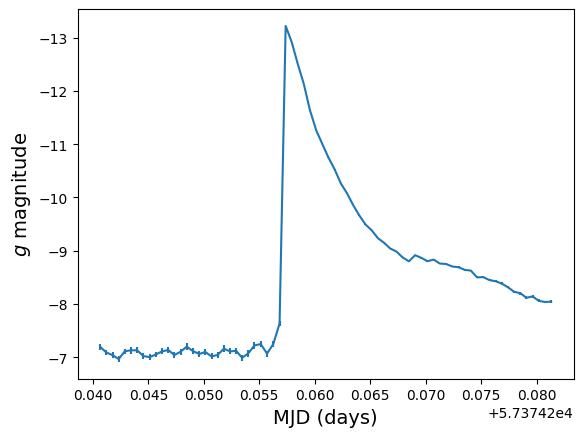

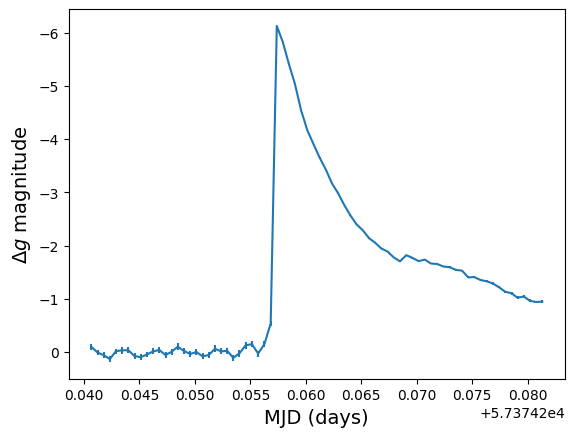

In [51]:
plt.errorbar([time.mjd for time in times], mags, yerr=magerrs)
plt.xlabel('MJD (days)', fontsize=14)
plt.ylabel(r'$g$ magnitude', fontsize=14)
plt.gca().invert_yaxis()
plt.show()

delta_mags = mags - np.median(mags[:21])
plt.errorbar([time.mjd for time in times], delta_mags, yerr=magerrs)
plt.xlabel('MJD (days)', fontsize=14)
plt.ylabel(r'$\Delta g$ magnitude', fontsize=14)
plt.gca().invert_yaxis()

In [52]:
##LIGHTCURVE GIF
for i in range(len(mags)):
    fig, ax = plt.subplots(1)

    ax.errorbar(dtime, mags - mags.max(), yerr=magerrs)
    ax.scatter(dtime[i], mags[i] - mags.max(), edgecolor='r', facecolor='none')
    ax.set_xlabel('Seconds since observation start', fontsize=16)
    ax.set_ylabel(r'$\Delta g$ magnitude', fontsize=16)
    ax.set_ylim(ax.get_ylim()[::-1])
    ax.tick_params(axis='both', labelsize=16)
    plt.savefig('/Users/riley/Desktop/RAFTS/Figures/dwf_gif/dwf_gif_lc{}.png'.format(i), bbox_inches='tight')
    plt.close()

In [53]:
np.save('/Users/riley/Desktop/RAFTS/Outdata/SEmagerrs', magerrs)

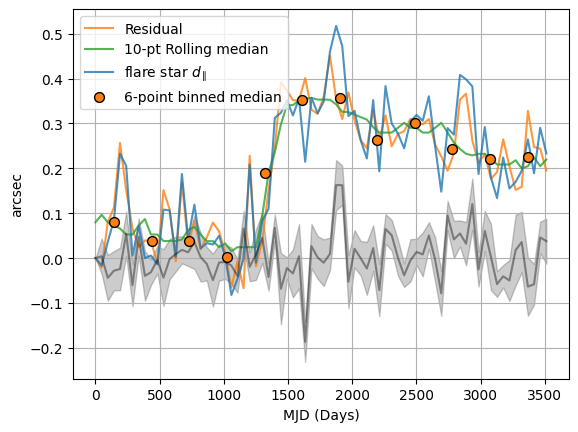

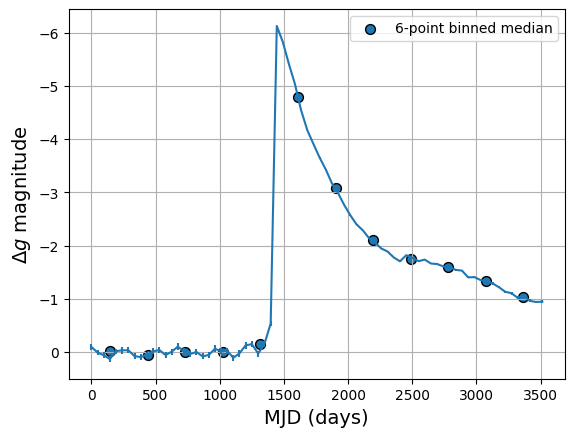

In [54]:
# Parameters for binning
num_bins = 12  # Number of bins

# Bin the time data
bin_edges = np.linspace(0, np.max(dtime), num_bins + 1)  # Create bin edges
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2  # Compute bin centers

# Compute median of x and y within each bin
med_d = []
med_f = []
med_am = []

for i in range(num_bins):
    # Select data within the current bin
    bin_mask = (dtime >= bin_edges[i]) & (dtime < bin_edges[i + 1])
    
    # Get the x and y values in this bin
    d_in_bin = dpar_raw[bin_mask]
    f_in_bin = delta_mags[bin_mask]
    am_in_bin = amst[bin_mask]
    
    # Calculate the median values for x and y
    med_d.append(np.median(d_in_bin))
    med_f.append(np.median(f_in_bin))
    med_am.append(np.median(am_in_bin))

plt.plot(dtime, (dpar_arr[0] - dpar_arr[1:].mean(axis=0)) * 3600, color='C1', alpha=0.8, label='Residual')
plt.plot(dtime, dpar_smooth, label='{}-pt Rolling median'.format(window), color='C2', alpha=0.8)

plt.plot(dtime, dpar_arr[0] * 3600, label='flare star $d_{\parallel}$', alpha=0.8, color='C0')
plt.plot(dtime, dpar_arr[1:].mean(axis=0) * 3600, color='black', alpha=0.4)
plt.scatter(bin_centers, med_d, edgecolor='k', facecolor='C1', s=50, zorder=2, 
            label='{:.0f}-point binned median'.format((len(dtime) / num_bins)))

plt.fill_between(dtime, (dpar_arr[1:].mean(axis=0) - dpar_arr[1:].std(axis=0)) * 3600, 
                   (dpar_arr[1:].mean(axis=0) + dpar_arr[1:].std(axis=0)) * 3600, color='black', alpha=0.2)

plt.xlabel('MJD (Days)')
plt.ylabel('arcsec')
plt.legend()
plt.grid()
plt.show()

plt.errorbar(dtime, delta_mags, yerr=magerrs, color='C0')
plt.scatter(bin_centers, med_f, edgecolor='k', facecolor='C0', s=50,
            label='{:.0f}-point binned median'.format((len(dtime) / num_bins)))
plt.xlabel('MJD (days)', fontsize=14)
plt.ylabel(r'$\Delta g$ magnitude', fontsize=14)
plt.gca().invert_yaxis()
plt.legend()
plt.grid()

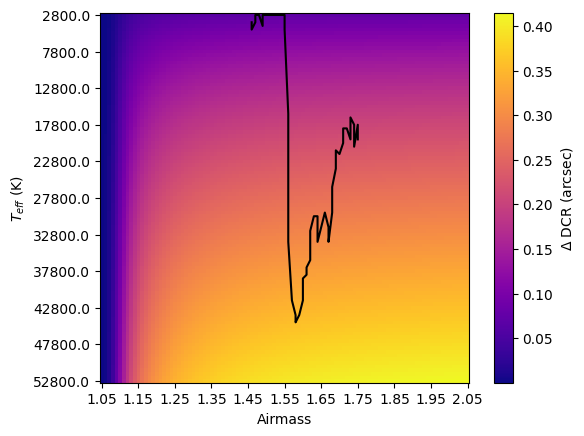

In [55]:
temp_eff = []

plt.imshow(grid, cmap='plasma')
plt.colorbar(label=r'$\Delta$ DCR (arcsec)')
plt.yticks(ticks=np.arange(0,110,10), labels = temps[::10])
plt.xticks(ticks=np.arange(0,110,10), labels = np.round(ams[::10], decimals=2))
plt.xlabel('Airmass')
plt.ylabel(r'$T_{eff}$ (K)')

xinds = []
yinds = []

for d, am in zip(dpar_smooth, amst):
    if np.isnan(d):
        temp_eff.append(np.nan)
    else:
        amind = np.argmin(np.abs(ams - am)) #Find column of grid closest to am(t)
        tempind = np.argmin(np.abs(grid[:,amind] - d)) #Find index of column closest to dpar(t)
        temp_eff.append(temps[tempind]) #append temp of that index
        xinds.append(amind)
        yinds.append(tempind)

plt.plot(xinds, yinds, color='k')
temp_eff = np.array(temp_eff)

In [56]:
amst

array([1.46071187, 1.46383532, 1.46696313, 1.4701134 , 1.47325367,
       1.47644162, 1.47972646, 1.48297042, 1.48629275, 1.48949247,
       1.49289569, 1.49621113, 1.49956752, 1.50292117, 1.50630044,
       1.50972821, 1.51323743, 1.51670154, 1.52018407, 1.52369808,
       1.52722673, 1.53077701, 1.53434693, 1.53785739, 1.54148284,
       1.54508301, 1.54880347, 1.55260932, 1.55638765, 1.56019322,
       1.56392776, 1.56760547, 1.57134818, 1.575136  , 1.57902216,
       1.58298778, 1.58688571, 1.59078537, 1.59485041, 1.59882875,
       1.6028305 , 1.6068912 , 1.61097471, 1.6150698 , 1.61919505,
       1.62346431, 1.62762555, 1.63188249, 1.6361399 , 1.64049296,
       1.64482594, 1.64925459, 1.65361239, 1.6580181 , 1.6624244 ,
       1.66693561, 1.67142261, 1.67604518, 1.68070194, 1.68524247,
       1.68981158, 1.694539  , 1.69922954, 1.70404494, 1.70876083,
       1.71348053, 1.71828197, 1.7231769 , 1.72809362, 1.73293621,
       1.73788664, 1.74284825, 1.74787617, 1.75291492])

Text(0.5, 0, 'Seconds since observation start')

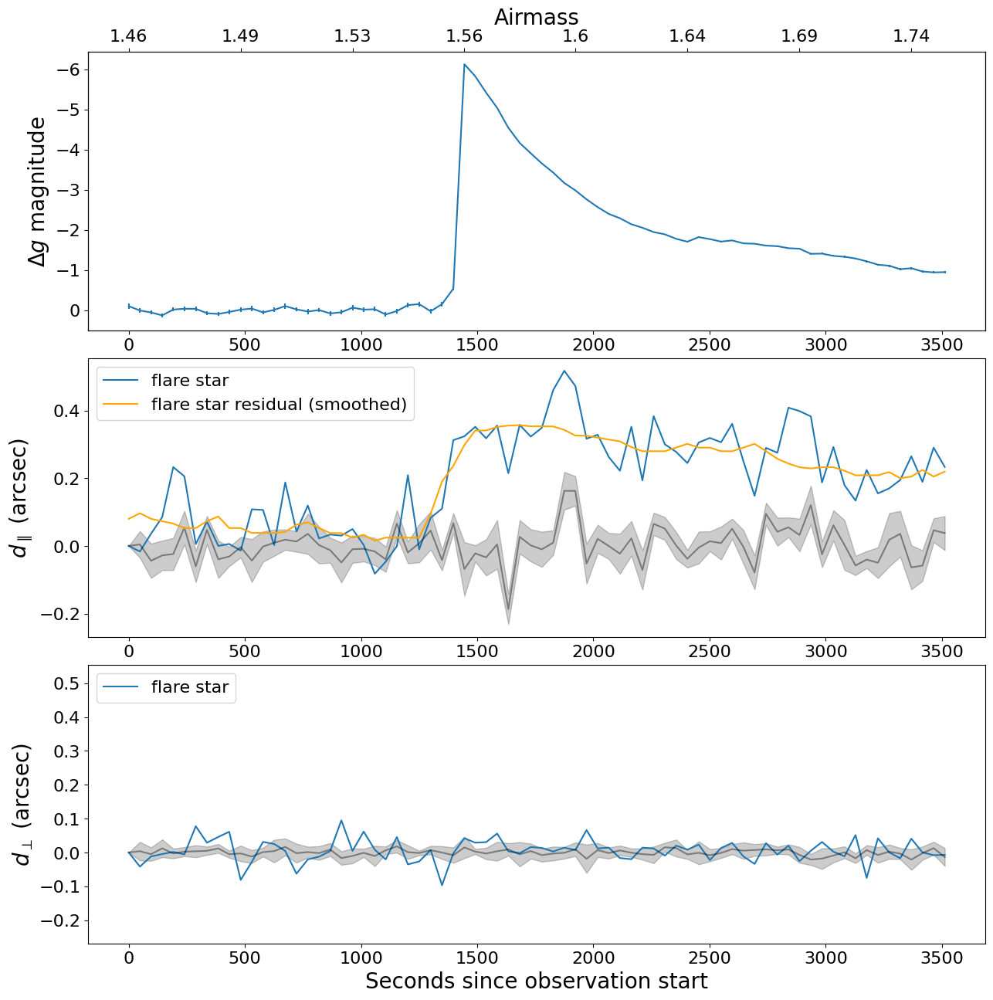

In [57]:
#Poster fig

fig, axes = plt.subplots(3,1, figsize=(15,15))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.1)
ax = axes.flatten()

ax[0].errorbar(dtime, delta_mags, yerr=magerrs)
#ax[0].plot([time.mjd for time in times], np.full_like(delta_mags, np.median(delta_mags[~np.isnan(dpar_smooth)][:20])))
#ax[0].fill_between([time.mjd for time in times], 
#                   np.median(delta_mags[~np.isnan(dpar_smooth)][:20]) - 4*np.std(delta_mags[~np.isnan(dpar_smooth)][:20]),
#                   np.median(delta_mags[~np.isnan(dpar_smooth)][:20]) + 4*np.std(delta_mags[~np.isnan(dpar_smooth)][:20]), color='C1', alpha=0.2)
ax[0].set_ylabel(r'$\Delta g$ magnitude', fontsize=20)
ax[0].set_ylim(ax[0].get_ylim()[::-1])
ax[0].set_yticklabels(ax[0].get_yticklabels(), fontsize=16)
ax[0].set_xticklabels(ax[0].get_xticklabels(), fontsize=16)
subax0 = ax[0].twiny()
subax0.set_xlim(ax[0].get_xlim())
subax0.set_xticks(np.array(dtime)[::10])
subax0.set_xticklabels(np.round(amst[::10], decimals=2), fontsize=16)
subax0.set_xlabel('Airmass', fontsize=20)

ax[1].plot(dtime, dpar_arr[0] * 3600, label='flare star')
ax[1].plot(dtime, dpar_arr[1:].mean(axis=0) * 3600, color='black', alpha=0.4)
ax[1].plot(dtime, dpar_smooth, color='orange', label='flare star residual (smoothed)')
ax[1].fill_between(dtime, (dpar_arr[1:].mean(axis=0) - dpar_arr[1:].std(axis=0)) * 3600, 
                   (dpar_arr[1:].mean(axis=0) + dpar_arr[1:].std(axis=0)) * 3600, color='black', alpha=0.2)
ax[1].set_ylabel(r'$d_{\parallel}$ (arcsec)', fontsize=20)
ax[1].tick_params(axis='both', labelsize=16)
ax[1].legend(fontsize=16)

ax[2].plot(dtime, (dtan_arr[0] - dtan_arr[1:].mean(axis=0)) * 3600, label='flare star')
ax[2].plot(dtime, dtan_arr[1:].mean(axis=0) * 3600, color='black', alpha=0.4)
ax[2].fill_between(dtime, (dtan_arr[1:].mean(axis=0) - dtan_arr[1:].std(axis=0)) * 3600, 
                   (dtan_arr[1:].mean(axis=0) + dtan_arr[1:].std(axis=0)) * 3600, color='black', alpha=0.2)
ax[2].set_ylabel(r'$d_{\perp}$ (arcsec)', fontsize=20)
ax[2].legend(loc='upper left', fontsize=16)

ax[2].set_ylim(ax[1].get_ylim())

ax[2].set_xticklabels(ax[2].get_xticklabels(), fontsize=16)
ax[2].set_yticklabels(ax[2].get_yticklabels(), fontsize=16)
ax[2].set_xlabel('Seconds since observation start', fontsize=20)

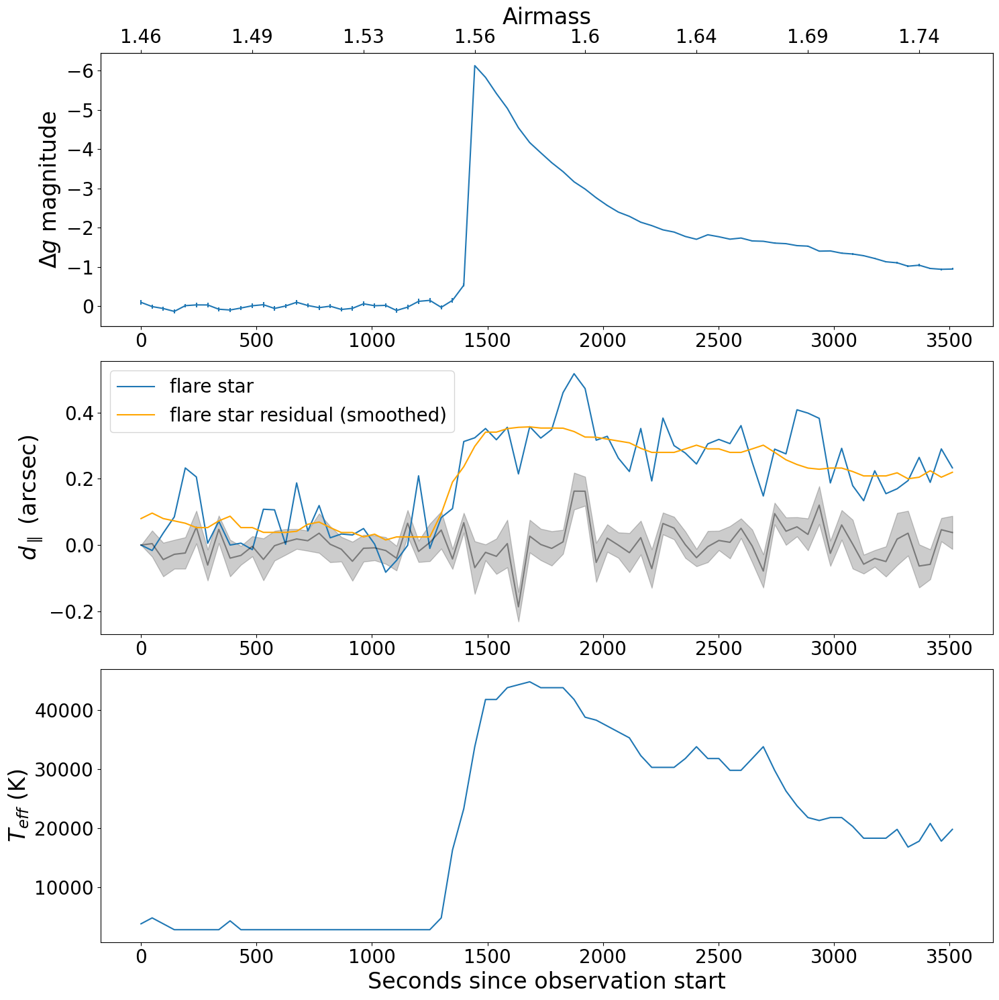

In [58]:
#Poster fig

fig, axes = plt.subplots(3,1, figsize=(15,15))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.1)
ax = axes.flatten()

ax[0].errorbar(dtime, delta_mags, yerr=magerrs)
#ax[0].plot([time.mjd for time in times], np.full_like(delta_mags, np.median(delta_mags[~np.isnan(dpar_smooth)][:20])))
#ax[0].fill_between([time.mjd for time in times], 
#                   np.median(delta_mags[~np.isnan(dpar_smooth)][:20]) - 4*np.std(delta_mags[~np.isnan(dpar_smooth)][:20]),
#                   np.median(delta_mags[~np.isnan(dpar_smooth)][:20]) + 4*np.std(delta_mags[~np.isnan(dpar_smooth)][:20]), color='C1', alpha=0.2)
ax[0].set_ylabel(r'$\Delta g$ magnitude', fontsize=24)
ax[0].set_ylim(ax[0].get_ylim()[::-1])
ax[0].set_yticklabels(ax[0].get_yticklabels(), fontsize=20)
ax[0].set_xticklabels(ax[0].get_xticklabels(), fontsize=20)
subax0 = ax[0].twiny()
subax0.set_xlim(ax[0].get_xlim())
subax0.set_xticks(np.array(dtime)[::10])
subax0.set_xticklabels(np.round(amst[::10], decimals=2), fontsize=20)
subax0.set_xlabel('Airmass', fontsize=24)

ax[1].plot(dtime, dpar_arr[0] * 3600, label='flare star')
ax[1].plot(dtime, dpar_arr[1:].mean(axis=0) * 3600, color='black', alpha=0.4)
ax[1].plot(dtime, dpar_smooth, color='orange', label='flare star residual (smoothed)')
ax[1].fill_between(dtime, (dpar_arr[1:].mean(axis=0) - dpar_arr[1:].std(axis=0)) * 3600, 
                   (dpar_arr[1:].mean(axis=0) + dpar_arr[1:].std(axis=0)) * 3600, color='black', alpha=0.2)
ax[1].set_ylabel(r'$d_{\parallel}$ (arcsec)', fontsize=24)
ax[1].tick_params(axis='both', labelsize=20)
ax[1].legend(fontsize=20)

ax[2].plot(dtime, temp_eff)
ax[2].set_ylabel(r'$T_{eff}$ (K)', fontsize=24)
ax[2].tick_params(axis='both', labelsize=20)
ax[2].set_xlabel('Seconds since observation start', fontsize=24)
ax[2].set_xlim(ax[1].get_xlim())

fig.tight_layout()
plt.savefig('/Users/Riley/Desktop/RAFTS/Figures/lc_dcr_temp_3panels', dpi=300, bbox_inches='tight')

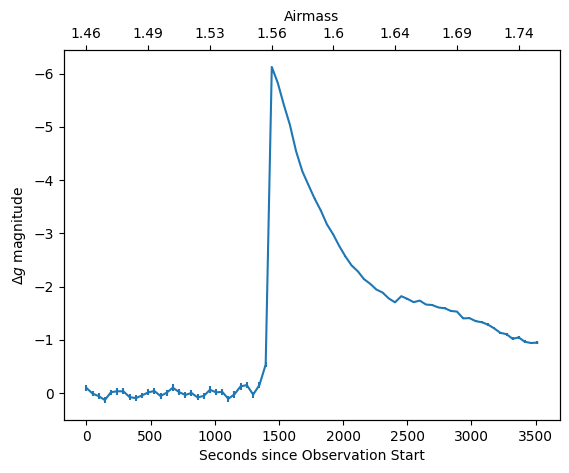

In [59]:
fig, ax = plt.subplots()

ax.errorbar(dtime, delta_mags, yerr=magerrs)
ax.set_ylabel(r'$\Delta g$ magnitude')
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_yticklabels(ax.get_yticklabels())
ax.set_xticklabels(ax.get_xticklabels())
ax.set_xlabel('Seconds since Observation Start')
subax0 = ax.twiny()
subax0.set_xlim(ax.get_xlim())
subax0.set_xticks(np.array(dtime)[::10])
subax0.set_xticklabels(np.round(amst[::10], decimals=2))
subax0.set_xlabel('Airmass')
plt.savefig('/Users/Riley/Desktop/RAFTS/Figures/dwflightcurve.png', dpi=300, bbox_inches='tight')

## Forward Modeling Filling factor 

### Spectro-photometric Approach

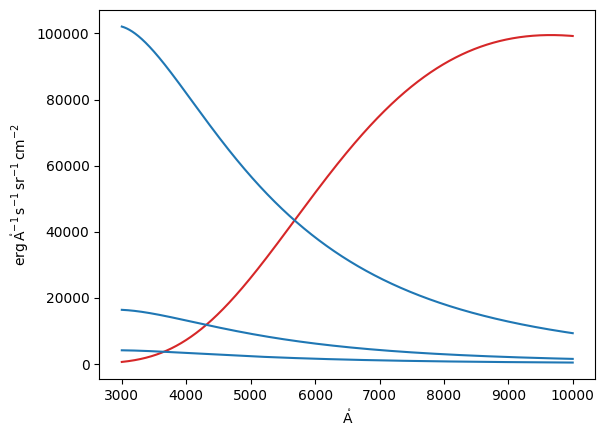

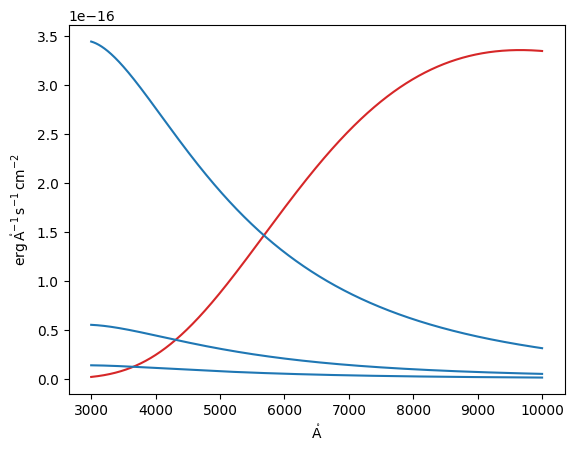

In [60]:
bb1 = BlackBody(temperature=3000*u.K, scale=1*u.erg/u.s/u.cm/u.cm/u.AA/u.sr)
bb2 = BlackBody(temperature=10000*u.K, scale=1*u.erg/u.s/u.cm/u.cm/u.AA/u.sr)

wav = np.arange(3000, 10000) * u.AA

plx = 10.27
dist = 1000 / plx * u.pc

Rstar = 0.1 * u.Rsun

# Star flux
flux1 = bb1(wav) * (2*np.pi*u.sr) * (Rstar.to('cm') **2) / ((dist.to('cm'))**2)
flux2 = bb2(wav)* (2*np.pi*u.sr) * (Rstar.to('cm') **2) / ((dist.to('cm'))**2)

with quantity_support():
    plt.figure()
    plt.plot(wav, bb1(wav), c='C3')
    plt.plot(wav, bb2(wav) * ( 0.01**2 ), c='C0')
    plt.plot(wav, bb2(wav) * ( 0.02**2 ), c='C0')
    plt.plot(wav, bb2(wav) * ( 0.05**2 ), c='C0')
    plt.show()

with quantity_support():
    plt.figure()
    plt.plot(wav, flux1, c='C3')
    plt.plot(wav, flux2* ( 0.01**2 ), c='C0')
    plt.plot(wav, flux2 * ( 0.02**2 ), c='C0')
    plt.plot(wav, flux2 * ( 0.05**2 ), c='C0')
    plt.show()

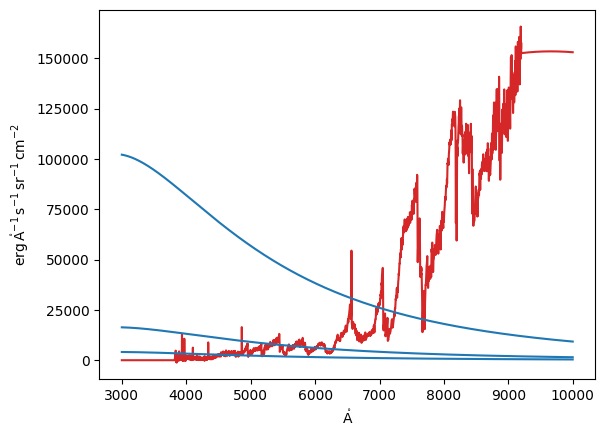

In [79]:
from config import WMAX, WMIN

mds = np.load('/Users/riley/Desktop/RAFTS/sdsstemplates/m7.active.ha.na.k_ext.npy')[int(wav[0].value):int(wav[-1].value+1)]
sdss_inds = [np.where(wav == WMIN * u.AA)[0][0], np.where(wav == WMAX * u.AA)[0][0].sum()]
C = bb2(wav)[sdss_inds[0]:sdss_inds[1]].sum().value * (0.05**2) / mds[sdss_inds[0]:sdss_inds[1]].sum() 
C *= 1*u.erg/u.s/u.cm/u.cm/u.AA/u.sr

with quantity_support():
    plt.figure()
    plt.plot(wav, mds * C, c='C3')
    plt.plot(wav, bb2(wav) * ( 0.01**2 ), c='C0')
    plt.plot(wav, bb2(wav) * ( 0.02**2 ), c='C0')
    plt.plot(wav, bb2(wav) * ( 0.05**2 ), c='C0')
    plt.show()

In [111]:
bins = 101
delta_g = np.zeros([bins, bins])
weff_grid = np.zeros([bins, bins])
delta_dcr = np.zeros([bins, bins,len(amst)])
delta_dcr_med_am = np.zeros([bins, bins, len(med_am)])
temprange = (2800, 68450)
arange = (0.0, 0.202)
temp_grid = np.arange(temprange[0], temprange[1], (temprange[1] - temprange[0]) / bins)
a_grid = np.arange(arange[0], arange[1], (arange[1] - arange[0]) / bins)
x_grid = amst
wav = np.arange(3000, 10000) * u.AA
plx = 10.27
dist = 1000 / plx * u.pc
Rstar = 0.1 * u.Rsun
linefrac = (0.1, 0.2)
f = filt_interp('g')
bandf = f(wav) * u.AA

for i, t in enumerate(temp_grid):
   for j, a in enumerate(a_grid):
      bb = BlackBody(temperature = t * u.K, scale = 1*u.erg/u.s/u.cm/u.cm/u.AA/u.sr)
      sed_bb = bb(wav)
      sed_dm = mds * C

      #Lines
      maxpt = wav[np.where(bandf == bandf.max())[0][0]]
      band_edges = (wav[bandf == bandf[(bandf > 0*u.AA) * (wav < maxpt)].min()][0], 
                    wav[bandf == bandf[(bandf > 0*u.AA) * (wav > maxpt)].min()][0])
      sed_sum = sed_bb[np.where(wav == band_edges[0])[0][0]:np.where(wav == band_edges[1])[0][0]].sum()
      lf = linefrac[0]
      l = lorentzian(wav.value, *linedict[linenames[0]]) + lorentzian(wav.value, *linedict[linenames[1]])
      lnew = l * (sed_sum / l.sum()) * lf 
      assert np.round(lnew.sum() / sed_sum, decimals=1) == lf
      sed_bb += lnew
      lf = linefrac[1]
      l = lorentzian(wav.value, *linedict[linenames[2]]) + lorentzian(wav.value, *linedict[linenames[3]]) + lorentzian(wav.value, *linedict[linenames[4]])
      lnew = l * (sed_sum / l.sum()) * lf 
      sed_bb += lnew
      assert np.round(lnew.sum() / sed_sum, decimals=1) == lf
      sed_flare = (sed_bb * (a**2)) + sed_dm
      
      ##delta mag
      g_flux = (np.nansum(bandf * sed_dm) / np.nansum(bandf)) * (2*np.pi*u.sr) * (Rstar.to('cm') **2) / ((dist.to('cm'))**2)
      g_flux_flare = (np.nansum(bandf * sed_flare) / np.nansum(bandf)) * (2*np.pi*u.sr) * (Rstar.to('cm') **2) / ((dist.to('cm'))**2)
      g_mag = 22.5 - 2.5 * np.log10(g_flux.value)
      g_mag_flare = 22.5 - 2.5 * np.log10(g_flux_flare.value)
      delta_g[i][j] = g_mag_flare - g_mag

      ##delta dcr
      lambda_eff_flare = np.exp(np.nansum(sed_flare * bandf * np.log(wav.value)) / np.nansum(sed_flare * bandf)).value
      lambda_eff = np.exp(np.nansum(sed_dm * bandf * np.log(wav.value)) / np.nansum(sed_dm * bandf)).value
      #lambda_eff = lamb_eff_md(band = 'g', temp = 0.0)
      #lambda_eff_flare = lamb_eff_md(band='g', temp = t, ff=a, lorentz_lines=True, linefrac=[0.1,0.2])
    
      weff_grid[i][j] = lambda_eff_flare
      delta_dcr[i][j][:] = dcr_offset(lambda_eff_flare, airmass = x_grid) - dcr_offset(lambda_eff, airmass = x_grid)
      delta_dcr_med_am[i][j][:] = dcr_offset(lambda_eff_flare, airmass = np.array(med_am)) - dcr_offset(lambda_eff, airmass = np.array(med_am))

np.save('/Users/riley/Desktop/RAFTS/Outdata/weffGrid', weff_grid)
np.save('/Users/riley/Desktop/RAFTS/Outdata/deltaG', delta_g)
np.save('/Users/riley/Desktop/RAFTS/Outdata/deltaDCR', delta_dcr)
np.save('/Users/riley/Desktop/RAFTS/Outdata/deltaMagSE', delta_mags)

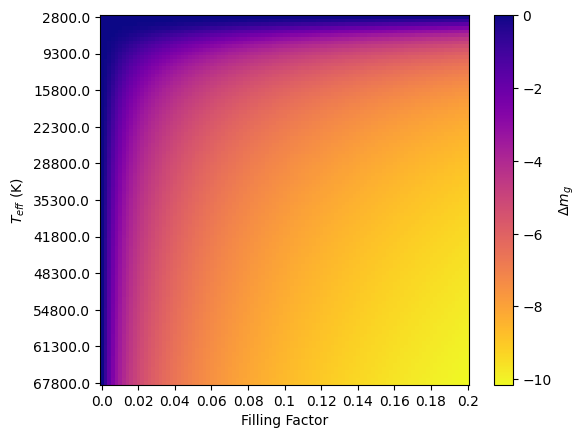

In [112]:
plt.imshow(delta_g, cmap='plasma_r')
plt.colorbar(label=r'$\Delta m_g$')
plt.yticks(ticks=np.arange(0,110,10), labels = temp_grid[::10])
plt.xticks(ticks=np.arange(0,110,10), labels = np.round(a_grid[::10], decimals=2))
plt.xlabel('Filling Factor')
plt.ylabel(r'$T_{eff}$ (K)')
plt.savefig('/Users/Riley/Desktop/RAFTS/Figures/fowardmodel_deltag.png', dpi=300, bbox_inches='tight')

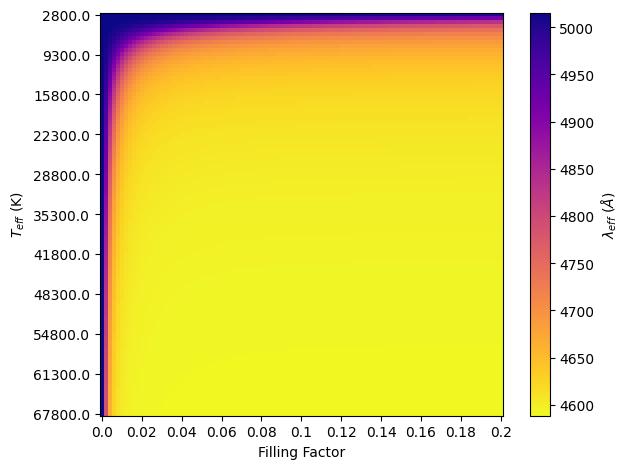

In [113]:
fig, ax = plt.subplots()

im = ax.imshow(weff_grid, cmap='plasma_r', clim=(weff_grid.min(), weff_grid.max()))
ax.set_yticks(ticks=np.arange(0,110,10), labels = temp_grid[::10])
ax.set_xticks(ticks=np.arange(0,110,10), labels = np.round(a_grid[::10], decimals=2))
ax.set_xlabel('Filling Factor')
ax.set_ylabel(r'$T_{eff}$ (K)')

fig.colorbar(im, label=r'$\lambda_{eff}$ $(\AA)$')
fig.tight_layout()
plt.show()

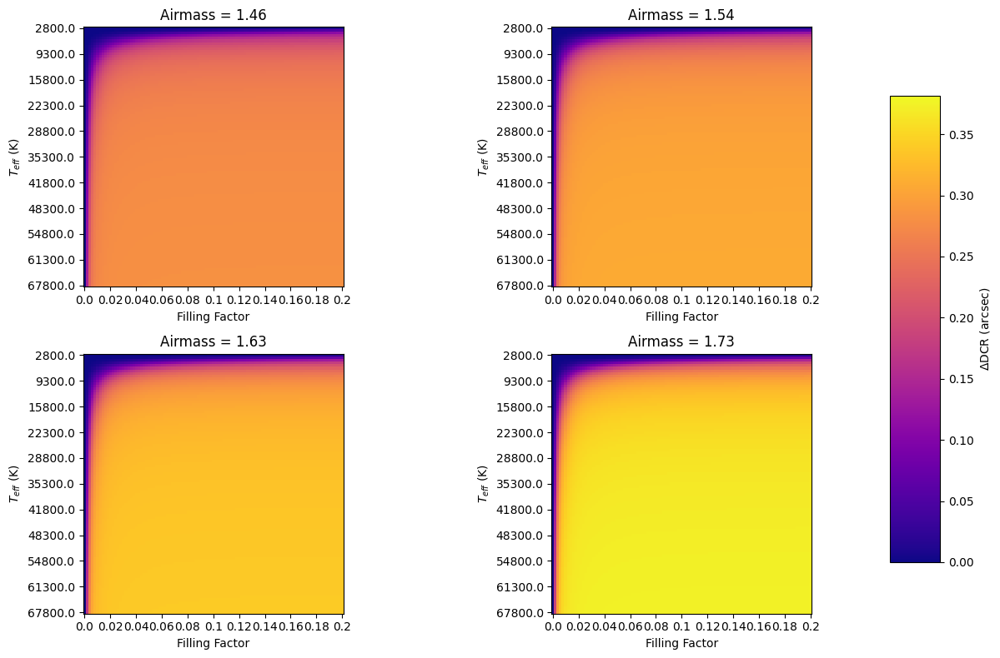

In [104]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8))
for i, ax in enumerate(axes.flat):
    im = ax.imshow(delta_dcr[:,:,i*23], cmap='plasma', clim=(delta_dcr.min(), delta_dcr.max()))
    ax.set_yticks(ticks=np.arange(0,110,10), labels = temp_grid[::10])
    ax.set_xticks(ticks=np.arange(0,110,10), labels = np.round(a_grid[::10], decimals=2))
    ax.set_xlabel('Filling Factor')
    ax.set_ylabel(r'$T_{eff}$ (K)')
    ax.set_title('Airmass = {0:.2f}'.format(amst[i*23]))

#fig.subplots_adjust(right=0.8, top=0.95, bottom=0.05)
cbar_ax = fig.add_axes([0.95, 0.15, 0.05, 0.7])
fig.colorbar(im, cax=cbar_ax, label=r'$\Delta$DCR (arcsec)')
fig.tight_layout()
plt.savefig('/Users/Riley/Desktop/RAFTS/Figures/forwardmodel_ddcr.png', dpi=300, bbox_inches='tight')
plt.show()

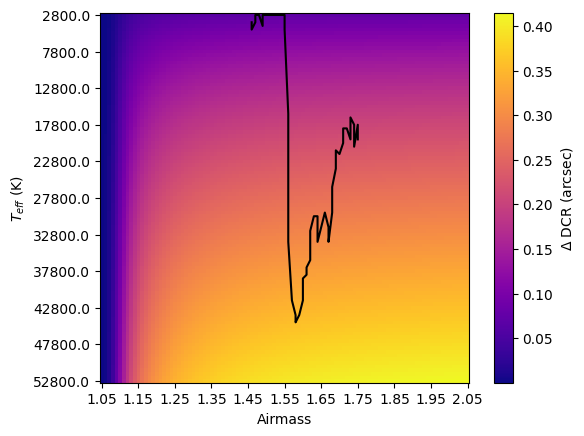

In [66]:
temp_eff = []

plt.imshow(grid, cmap='plasma')
plt.colorbar(label=r'$\Delta$ DCR (arcsec)')
plt.yticks(ticks=np.arange(0,110,10), labels = temps[::10])
plt.xticks(ticks=np.arange(0,110,10), labels = np.round(ams[::10], decimals=2))
plt.xlabel('Airmass')
plt.ylabel(r'$T_{eff}$ (K)')

xinds = []
yinds = []

for d, am in zip(dpar_smooth, amst):
    if np.isnan(d):
        temp_eff.append(np.nan)
    else:
        amind = np.argmin(np.abs(ams - am)) #Find column of grid closest to am(t)
        tempind = np.argmin(np.abs(grid[:,amind] - d)) #Find index of column closest to dpar(t)
        temp_eff.append(temps[tempind]) #append temp of that index
        xinds.append(amind)
        yinds.append(tempind)

plt.plot(xinds, yinds, color='k')
temp_eff = np.array(temp_eff)
plt.savefig('/Users/Riley/Desktop/RAFTS/Figures/teff_am_grid.png', dpi=300, bbox_inches='tight')

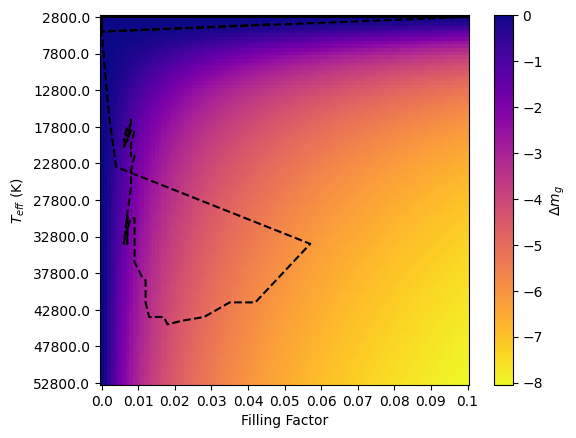

In [67]:
ff_curve = []
xinds = []
yinds = []

for d, mag, am, temp in zip(dpar_smooth, delta_mags, amst, temp_eff):

    if np.isnan(d):
        ff_curve.append(np.nan)
    else:
        tempind = np.argmin(np.abs(temp_grid - temp))
        dgind = np.argmin(np.abs(delta_g[tempind,:] - mag))

        if mag - np.median(delta_mags[~np.isnan(dpar_smooth)][:20]) > np.median(delta_mags[~np.isnan(dpar_smooth)][:20]) - 4*delta_mags[~np.isnan(dpar_smooth)][:20].std():
            ff_curve.append(0.0)
        else:
            ff_curve.append(a_grid[dgind])

        xinds.append(dgind)
        yinds.append(tempind)

ff_curve = np.array(ff_curve)

plt.figure()
plt.imshow(delta_g, cmap='plasma_r')
plt.colorbar(label=r'$\Delta m_g$')
plt.yticks(ticks=np.arange(0,110,10), labels = temp_grid[::10])
plt.xticks(ticks=np.arange(0,110,10), labels = np.round(a_grid[::10], decimals=2))
plt.xlabel('Filling Factor')
plt.ylabel(r'$T_{eff}$ (K)');
plt.plot(xinds, yinds, 'k--')

Text(0, 0.5, 'Filling factor')

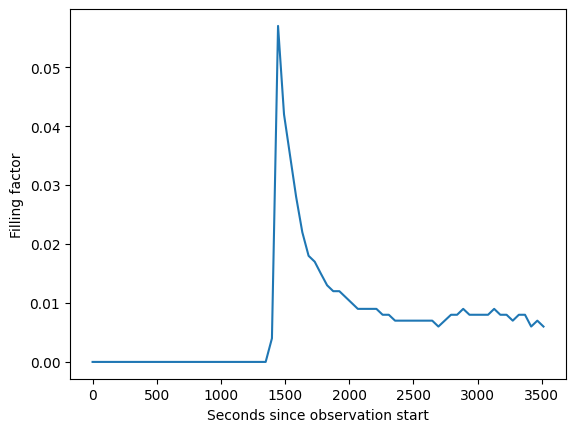

In [68]:
plt.plot(dtime, ff_curve)
plt.xlabel('Seconds since observation start')
plt.ylabel('Filling factor')

## Modelling Temp + FF Simultaneously

In [69]:
flr_teffs = []
flr_ffs = []

c = 0
for dpar, dmag in zip(dpar_smooth, delta_mags):

    model_dpars = delta_dcr[:,:,c]
    model_mags = delta_g

    distances = np.sqrt( (dpar - model_dpars)**2 + (dmag - model_mags)**2 )
    mindex = list(np.where(distances == np.nanmin(distances)))

    if len(mindex[0]) == 0:
        flr_teffs.append(np.nan)
        flr_ffs.append(np.nan)

    else:
        minds = [ind[0] for ind in mindex]
        flr_teffs.append(temp_grid[minds[0]])
        flr_ffs.append(a_grid[minds[1]])

    c += 1

In [70]:
flr_med_teffs = []
flr_med_ffs = []

c = 0
for d, f in zip(med_d, med_f):

    model_dpars = delta_dcr_med_am[:,:,c]
    model_mags = delta_g

    distances = np.sqrt( (d - model_dpars)**2 + (f - model_mags)**2 )
    mindex = list(np.where(distances == np.nanmin(distances)))

    if len(mindex[0]) == 0:
        flr_med_teffs.append(np.nan)
        flr_med_ffs.append(np.nan)

    else:
        minds = [ind[0] for ind in mindex]
        flr_med_teffs.append(temp_grid[minds[0]])
        flr_med_ffs.append(a_grid[minds[1]])

    c += 1

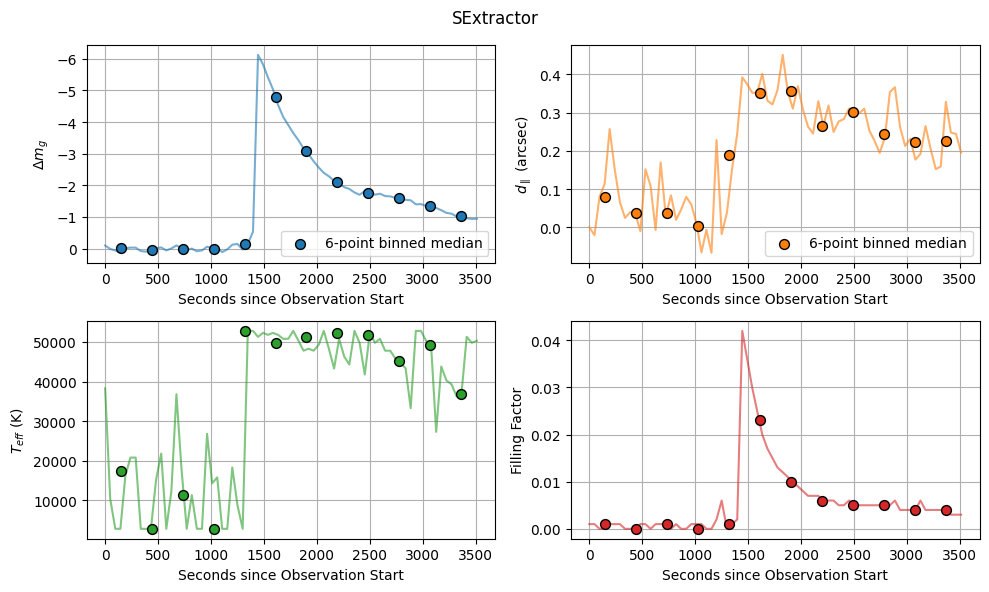

In [71]:
fig, axes = plt.subplots(2,2, figsize=(10,6))

ax = axes.flatten()


ax[0].plot(dtime, delta_mags, c='C0', alpha=0.6)
ax[0].scatter(bin_centers, med_f, edgecolor='k', facecolor='C0', s=50, zorder=2, 
            label='{:.0f}-point binned median'.format(len(dtime) / num_bins))
ax[0].set_xlabel('Seconds since Observation Start')
ax[0].set_ylabel(r'$\Delta m_g$')
ax[0].set_ylim(ax[0].get_ylim()[::-1])
ax[0].legend(loc='lower right')

ax[1].plot(dtime, dpar_raw, c='C1', alpha=0.6)
#ax[1].plot(dtime, dpar_smooth, c='C1', ls='--', alpha=1)
ax[1].scatter(bin_centers, med_d, edgecolor='k', facecolor='C1', s=50, zorder=2, 
            label='{:.0f}-point binned median'.format(len(dtime) / num_bins))
ax[1].set_ylabel(r'$d_{\parallel}$ (arcsec)')
ax[1].set_xlabel('Seconds since Observation Start')
ax[1].legend()


ax[2].plot(dtime, flr_teffs, c='C2', alpha=0.6)
ax[2].scatter(bin_centers, flr_med_teffs, edgecolor='k', facecolor='C2', s=50, zorder=2, 
            label='{:.0f}-point binned median'.format(len(dtime) / num_bins))
ax[2].set_xlabel('Seconds since Observation Start')
ax[2].set_ylabel(r'$T_{eff}$ (K)')

ax[3].plot(dtime, flr_ffs, c='C3', alpha=0.6)
ax[3].scatter(bin_centers, flr_med_ffs, edgecolor='k', facecolor='C3', s=50, zorder=2, 
            label='{:.0f}-point binned median'.format(len(dtime) / num_bins))
ax[3].set_ylabel('Filling Factor')
ax[3].set_xlabel('Seconds since Observation Start')

for a in ax:
    a.grid()
    a.set_xlim(ax[0].get_xlim())

fig.suptitle('SExtractor')
fig.tight_layout()


Sum under blackbody = 2235392266.6197147 erg / (Angstrom cm2 s sr)
Sum under Ca lines = 223539226.66197142 erg / (Angstrom cm2 s sr) (9.999999999999998% of blackbody)
Sum under H lines = 447078453.3239429 erg / (Angstrom cm2 s sr) (20.0% of blackbody)

Flux enhancement vs. color enhancement for 40000 K Blackbody, X=1.5, FF = 0.05
--------------------------
Delta g (no lines) = -2.461
Delta g (with lines) = -6.348
Mag percent change (no lines) = -4.215%
Mag percent change (with lines) = -10.870%

Delta DCR (no lines) = 0.228
Delta DCR (with lines) = 0.256
DCR percent change (no lines) = 0.354%
DCR percent change (with lines) = 0.398%
Delta DCR::Delta Mag percent change ratio = 0.037


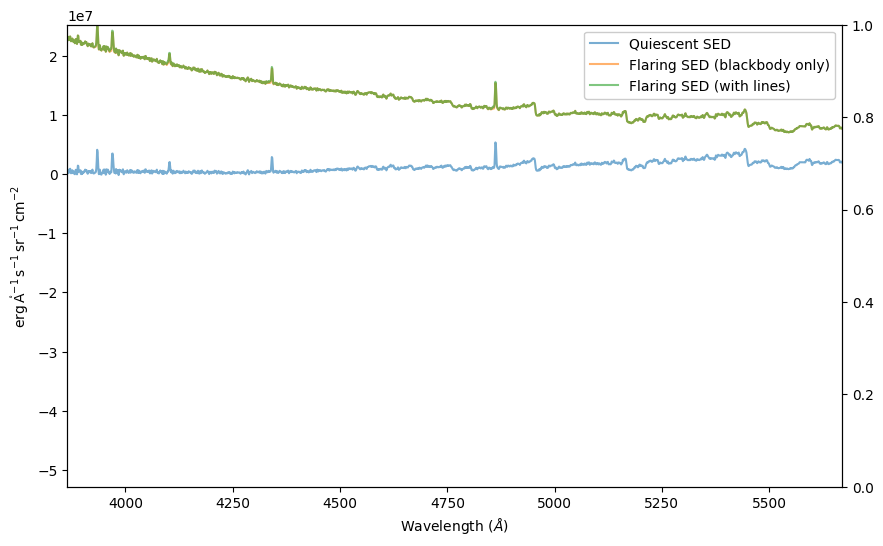

In [151]:
from utils import lorentzian
from config import linedict, linenames, WAVELENGTH

mds = np.load('/Users/riley/Desktop/RAFTS/sdsstemplates/m7.active.ha.na.k_ext.npy')

linefrac = [0.1, 0.2]

bandf = filt_interp(band='g')(WAVELENGTH)
maxpt = np.where(bandf == bandf.max())[0][0]
band_edges = (WAVELENGTH[bandf == bandf[(bandf > 0) * (WAVELENGTH < maxpt)].min()][0], 
              WAVELENGTH[bandf == bandf[(bandf > 0) * (WAVELENGTH > maxpt)].min()][0])

T = 40000
X = 1.5
baselineFF = 0.025

bb = BlackBody(temperature=T*u.K, scale=1*u.erg/u.s/u.cm/u.cm/u.AA/u.sr)
bb10K = BlackBody(temperature=10000*u.K, scale=1*u.erg/u.s/u.cm/u.cm/u.AA/u.sr)
C = bb10K(WAVELENGTH)[sdss_inds[0]:sdss_inds[1]].sum().value * (baselineFF) / mds[sdss_inds[0]:sdss_inds[1]].sum() 
C *= 1*u.erg/u.s/u.cm/u.cm/u.AA/u.sr
sed_dm = mds * C
sed_bb = bb(WAVELENGTH)
sed_sum = sed_dm[band_edges[0]:band_edges[1]].sum()
print('Sum under blackbody = {}'.format(sed_sum))

lf = linefrac[0]
l = lorentzian(WAVELENGTH, *linedict[linenames[0]]) +  lorentzian(WAVELENGTH, *linedict[linenames[1]])
lnew = l * (sed_sum / l.sum()) * lf
sed_lines = sed_bb + lnew
print('Sum under Ca lines = {0} ({1}% of blackbody)'.format(lnew.sum(), (lnew.sum() / sed_sum)*100))

lf = linefrac[1]
l = lorentzian(WAVELENGTH, *linedict[linenames[2]]) +  lorentzian(WAVELENGTH, *linedict[linenames[3]]) + lorentzian(WAVELENGTH, *linedict[linenames[4]])
lnew = l * (sed_sum / l.sum()) * lf
print('Sum under H lines = {0} ({1}% of blackbody)'.format(lnew.sum(), (lnew.sum() / sed_sum)*100))
sed_lines += lnew

sed_flare_lines = (sed_bb * baselineFF) + sed_dm
sed_flare_nolines = (sed_lines * baselineFF) + sed_dm

with quantity_support():
    fig, ax = plt.subplots(figsize=(10,6))
    ax2 = ax.twinx()
    ax.plot(WAVELENGTH, sed_dm, c='C0', alpha=0.6, label='Quiescent SED')
    ax.plot(WAVELENGTH, sed_flare_lines, c='C1', alpha=0.6, label='Flaring SED (blackbody only)')
    ax.plot(WAVELENGTH, sed_flare_nolines, c='C2', alpha=0.6, label='Flaring SED (with lines)')
    fig.legend(framealpha=1, bbox_to_anchor=(0.9,0.88))
    ax.set_ylim(None, np.nanmax(sed_flare_lines[band_edges[0]:band_edges[1]]))

    #ax2.plot(WAVELENGTH, bandf, color='k', alpha=0.4, label='DECam g')
    #ax2.set_ylabel('Filter throughput')
    ax.set_xlim(band_edges[0], band_edges[1])
    ax.set_xlabel(r'Wavelength ($\AA$)')

    fig.show()

##delta mag
g_flux = (np.nansum(bandf * sed_dm) / np.nansum(bandf)) * (2*np.pi*u.sr) * (Rstar.to('cm') **2) / ((dist.to('cm'))**2)
g_flux_flare = (np.nansum(bandf * sed_flare) / np.nansum(bandf)) * (2*np.pi*u.sr) * (Rstar.to('cm') **2) / ((dist.to('cm'))**2)
g_flux_flare_lines = (np.nansum(bandf * sed_lines) / np.nansum(bandf)) * (2*np.pi*u.sr) * (Rstar.to('cm') **2) / ((dist.to('cm'))**2)
g_mag = 22.5 - 2.5 * np.log10(g_flux.value)
g_mag_flare = 22.5 - 2.5 * np.log10(g_flux_flare.value)
g_mag_flare_lines = 22.5 - 2.5 * np.log10(g_flux_flare_lines.value)
delta_g = g_mag_flare - g_mag
delta_g_lines = g_mag_flare_lines - g_mag

##delta dcr
lambda_eff_flare = np.exp(np.nansum(sed_flare * bandf * np.log(WAVELENGTH)) / np.nansum(sed_flare * bandf))
lambda_eff_flare_lines = np.exp(np.nansum(sed_lines * bandf * np.log(WAVELENGTH)) / np.nansum(sed_lines * bandf))
lambda_eff = np.exp(np.nansum(sed_dm * bandf * np.log(WAVELENGTH)) / np.nansum(sed_dm * bandf))

dcr = dcr_offset(lambda_eff.value, airmass = X)
dcr_flare = dcr_offset(lambda_eff_flare.value, airmass = X)
dcr_flare_lines = dcr_offset(lambda_eff_flare_lines.value, airmass = X)

ddcr = dcr_flare - dcr
ddcr_lines = dcr_flare_lines - dcr

print('')
print('Flux enhancement vs. color enhancement for {0} K Blackbody, X={1}, FF = {2}'.format(T, X, FF))
print('--------------------------')
print('Delta g (no lines) = {0:.3f}'.format(delta_g))
print('Delta g (with lines) = {0:.3f}'.format(delta_g_lines))
print('Mag percent change (no lines) = {0:.3f}%'.format(((g_mag_flare - g_mag) / g_mag) * 100))
print('Mag percent change (with lines) = {0:.3f}%'.format(((g_mag_flare_lines - g_mag) / g_mag) * 100))
print('')
print('Delta DCR (no lines) = {0:.3f}'.format(ddcr))
print('Delta DCR (with lines) = ' + '{0:.3f}'.format(ddcr_lines))
print('DCR percent change (no lines) = {0:.3f}%'.format(((dcr_flare - dcr) / dcr) * 100))
print('DCR percent change (with lines) = {0:.3f}%'.format(((dcr_flare_lines - dcr) / dcr) * 100))

print('Delta DCR::Delta Mag percent change ratio = {0:.3f}'.format(abs(((dcr_flare_lines - dcr) / dcr * 100) / ((g_mag_flare_lines - g_mag) / g_mag * 100))))

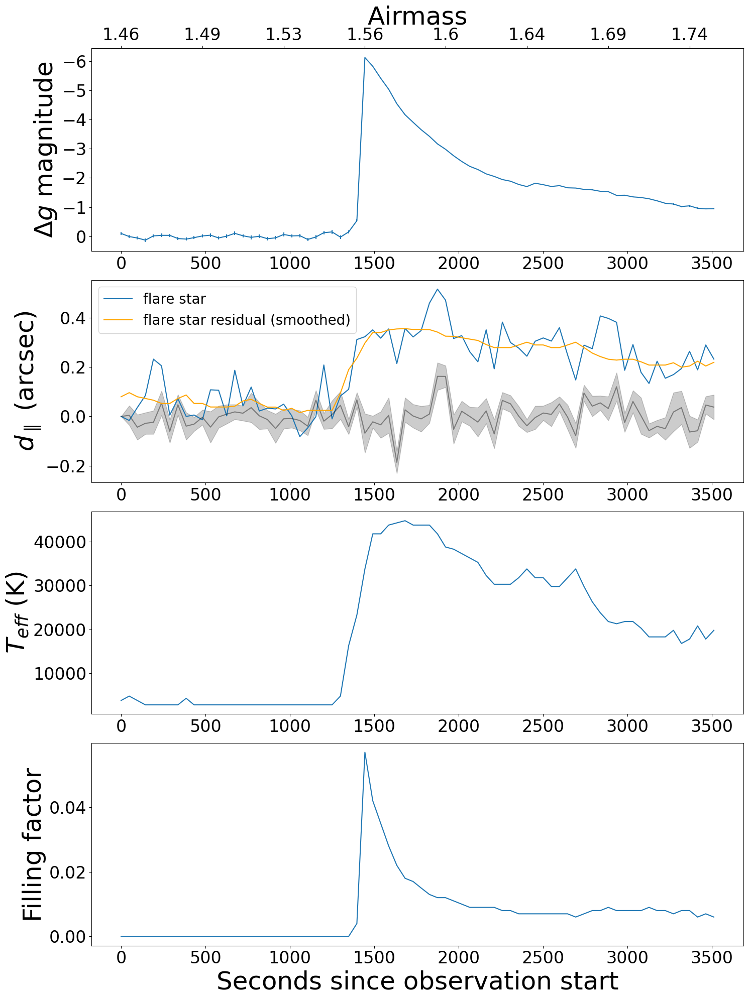

In [73]:
#Poster fig

fig, axes = plt.subplots(4,1, figsize=(15,20))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.1)
ax = axes.flatten()

ax[0].errorbar(dtime, delta_mags, yerr=magerrs)
#ax[0].plot([time.mjd for time in times], np.full_like(delta_mags, np.median(delta_mags[~np.isnan(dpar_smooth)][:20])))
#ax[0].fill_between([time.mjd for time in times], 
#                   np.median(delta_mags[~np.isnan(dpar_smooth)][:20]) - 4*np.std(delta_mags[~np.isnan(dpar_smooth)][:20]),
#                   np.median(delta_mags[~np.isnan(dpar_smooth)][:20]) + 4*np.std(delta_mags[~np.isnan(dpar_smooth)][:20]), color='C1', alpha=0.2)
ax[0].set_ylabel(r'$\Delta g$ magnitude', fontsize=36)
ax[0].set_ylim(ax[0].get_ylim()[::-1])
ax[0].set_yticklabels(ax[0].get_yticklabels(), fontsize=24)
ax[0].set_xticklabels(ax[0].get_xticklabels(), fontsize=24)
subax0 = ax[0].twiny()
subax0.set_xlim(ax[0].get_xlim())
subax0.set_xticks(np.array(dtime)[::10])
subax0.set_xticklabels(np.round(amst[::10], decimals=2), fontsize=24)
subax0.set_xlabel('Airmass', fontsize=36)

ax[1].plot(dtime, dpar_arr[0] * 3600, label='flare star')
ax[1].plot(dtime, dpar_arr[1:].mean(axis=0) * 3600, color='black', alpha=0.4)
ax[1].plot(dtime, dpar_smooth, color='orange', label='flare star residual (smoothed)')
ax[1].fill_between(dtime, (dpar_arr[1:].mean(axis=0) - dpar_arr[1:].std(axis=0)) * 3600, 
                   (dpar_arr[1:].mean(axis=0) + dpar_arr[1:].std(axis=0)) * 3600, color='black', alpha=0.2)
ax[1].set_ylabel(r'$d_{\parallel}$ (arcsec)', fontsize=36)
ax[1].tick_params(axis='both', labelsize=24)
ax[1].legend(loc='upper left', fontsize=20)

ax[2].plot(dtime, temp_eff)
ax[2].set_ylabel(r'$T_{eff}$ (K)', fontsize=36)
ax[2].tick_params(axis='both', labelsize=24)
ax[2].set_xlim(ax[1].get_xlim())

ax[3].plot(dtime, ff_curve)
ax[3].set_xlabel('Seconds since observation start', fontsize=36)
ax[3].set_ylabel('Filling factor', fontsize=36)
ax[3].tick_params(axis='both', labelsize=24)

fig.tight_layout()
plt.savefig('/Users/Riley/Desktop/RAFTS/Figures/lc_dcr_temp_4panels', dpi=300, bbox_inches='tight')

Do these model grids cover enough of the delta mag, delta DCR parameter space to match the observations?

In [ ]:
delta_dcr

In [76]:
plt.figure()
for i in range(len(amst)):
    plt.scatter(delta_dcr[:,:,i].flatten(), delta_g.flatten(), c='gray', s=1, alpha=1)

#plt.scatter(delta_dcr[:,:,-1].flatten(), delta_g.flatten(), c=np.repeat(temp_grid, 100), cmap='magma', s=5, alpha=0.5)
#plt.colorbar(label='temp')
plt.plot(dpar_smooth, delta_mags, c='k', ls=':', lw=1)
plt.scatter(dpar_smooth, delta_mags, c=amst, alpha=0.8)

plt.xlabel(r'$\Delta$DCR (arcsec)')
plt.ylabel(r'$\Delta m_g$ (mag)')
plt.gca().invert_yaxis()
plt.colorbar(label='Airmass')

IndexError: invalid index to scalar variable.

<Figure size 640x480 with 0 Axes>

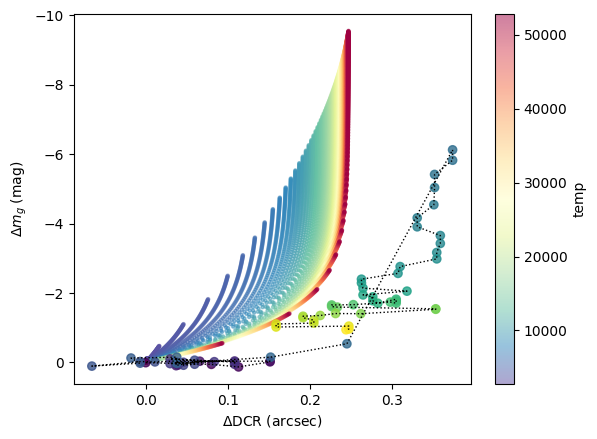

In [ ]:
plt.figure()

plt.scatter(delta_dcr[:,:,0].flatten(), delta_g.flatten(), c=np.repeat(temp_grid, 101), cmap='Spectral_r', s=5, alpha=0.5)
plt.colorbar(label='temp')
plt.plot(dpar_smooth, delta_mags, c='k', ls=':', lw=1)
plt.scatter(dpar_smooth, delta_mags, c=amst, alpha=0.8)

plt.xlabel(r'$\Delta$DCR (arcsec)')
plt.ylabel(r'$\Delta m_g$ (mag)')
plt.gca().invert_yaxis()
#plt.colorbar(label='Airmass')

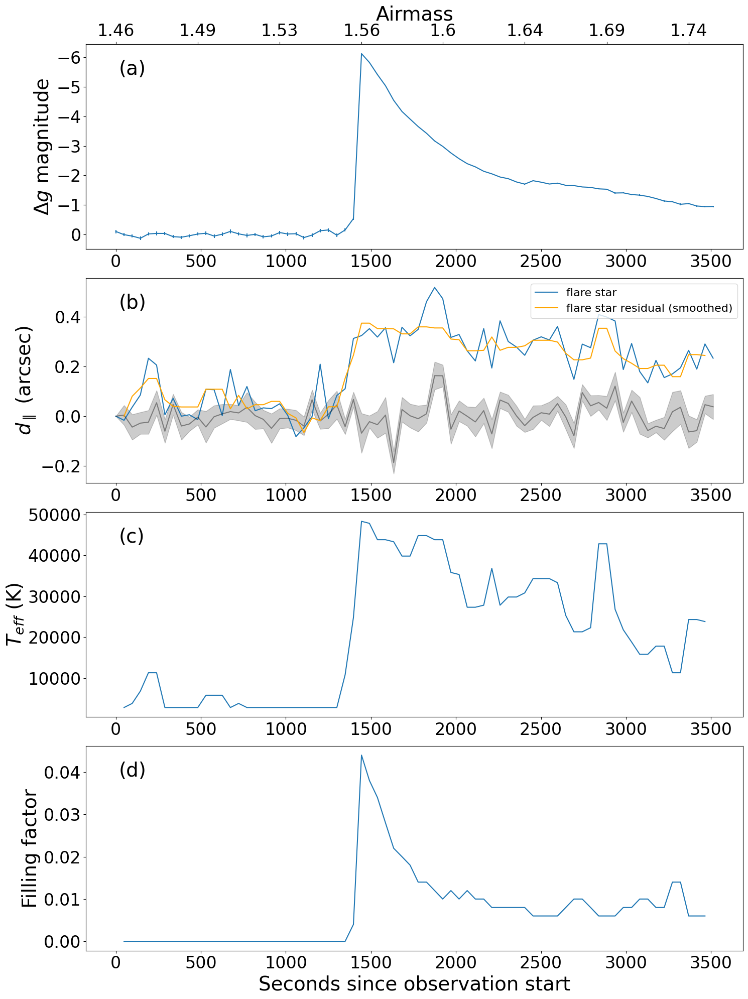

In [ ]:
#Poster fig

fig, axes = plt.subplots(4,1, figsize=(15,20))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.1)
ax = axes.flatten()

ax[0].errorbar(dtime, delta_mags, yerr=magerrs)
#ax[0].plot([time.mjd for time in times], np.full_like(delta_mags, np.median(delta_mags[~np.isnan(dpar_smooth)][:20])))
#ax[0].fill_between([time.mjd for time in times], 
#                   np.median(delta_mags[~np.isnan(dpar_smooth)][:20]) - 4*np.std(delta_mags[~np.isnan(dpar_smooth)][:20]),
#                   np.median(delta_mags[~np.isnan(dpar_smooth)][:20]) + 4*np.std(delta_mags[~np.isnan(dpar_smooth)][:20]), color='C1', alpha=0.2)
ax[0].set_ylabel(r'$\Delta g$ magnitude', fontsize=28)
ax[0].set_ylim(ax[0].get_ylim()[::-1])
ax[0].set_yticklabels(ax[0].get_yticklabels(), fontsize=24)
ax[0].set_xticklabels(ax[0].get_xticklabels(), fontsize=24)
ax[0].text(0.05, 0.85, '(a)', transform=ax[0].transAxes, fontsize=28)
subax0 = ax[0].twiny()
subax0.set_xlim(ax[0].get_xlim())
subax0.set_xticks(np.array(dtime)[::10])
subax0.set_xticklabels(np.round(amst[::10], decimals=2), fontsize=24)
subax0.set_xlabel('Airmass', fontsize=28)

ax[1].plot(dtime, dpar_arr[0] * 3600, label='flare star')
ax[1].plot(dtime, dpar_arr[1:].mean(axis=0) * 3600, color='black', alpha=0.4)
ax[1].plot(dtime, dpar_smooth, color='orange', label='flare star residual (smoothed)')
ax[1].fill_between(dtime, (dpar_arr[1:].mean(axis=0) - dpar_arr[1:].std(axis=0)) * 3600, 
                   (dpar_arr[1:].mean(axis=0) + dpar_arr[1:].std(axis=0)) * 3600, color='black', alpha=0.2)
ax[1].set_ylabel(r'$d_{\parallel}$ (arcsec)', fontsize=28)
ax[1].tick_params(axis='both', labelsize=24)
ax[1].legend(fontsize=16, loc='upper right')
ax[1].text(0.05, 0.85, '(b)', transform=ax[1].transAxes, fontsize=28)


ax[2].plot(dtime, temp_eff)
ax[2].set_ylabel(r'$T_{eff}$ (K)', fontsize=28)
ax[2].tick_params(axis='both', labelsize=24)
ax[2].set_xlim(ax[1].get_xlim())
ax[2].text(0.05, 0.85, '(c)', transform=ax[2].transAxes, fontsize=28)


ax[3].plot(dtime, ff_curve)
ax[3].set_xlabel('Seconds since observation start', fontsize=28)
ax[3].set_ylabel('Filling factor', fontsize=28)
ax[3].tick_params(axis='both', labelsize=24)
ax[3].set_xlim(ax[1].get_xlim())
ax[3].text(0.05, 0.85, '(d)', transform=ax[3].transAxes, fontsize=28)

fig.tight_layout()

plt.savefig('/Users/Riley/Desktop/RAFTS/Figures/lc_dcr_temp_4panels', dpi=300, bbox_inches='tight')

## Reproduce GAIA HR diagram with spectral type top axis, mark flare star

In [ ]:
from astroquery.gaia import Gaia

In [ ]:
def send_radial_gaia_query(query_size=1000000, distance=200, **kwargs):
    """
    Sends an archive query for d < 200 pc, with additional filters taken from
    Gaia Data Release 2: Observational Hertzsprung-Russell diagrams (Sect. 2.1)
    Gaia Collaboration, Babusiaux et al. (2018)
    (https://doi.org/10.1051/0004-6361/201832843)

    NOTE: 10000000 is a maximum query size (~76 MB / column)

    Additional keyword arguments are passed to TapPlus.launch_job_async method.
    """

    job = Gaia.launch_job_async("select top {}".format(query_size)+
                #" lum_val, teff_val,"
                #" ra, dec, parallax,"
                " bp_rp, phot_g_mean_mag+5*log10(parallax)-10 as mg"
         " from gaiadr2.gaia_source"
         " where parallax_over_error > 10"
         " and visibility_periods_used > 8"
         " and phot_g_mean_flux_over_error > 50"
         " and phot_bp_mean_flux_over_error > 20"
         " and phot_rp_mean_flux_over_error > 20"
         " and phot_bp_rp_excess_factor <"
            " 1.3+0.06*power(phot_bp_mean_mag-phot_rp_mean_mag,2)"
         " and phot_bp_rp_excess_factor >"
            " 1.0+0.015*power(phot_bp_mean_mag-phot_rp_mean_mag,2)"
         " and astrometric_chi2_al/(astrometric_n_good_obs_al-5)<"
            "1.44*greatest(1,exp(-0.4*(phot_g_mean_mag-19.5)))"
         +" and 1000/parallax <= {}".format(distance), **kwargs)

    return job

In [ ]:
try:
    gaiarec = np.recfromcsv("/Users/Riley/Desktop/RAFTS/gaia-hrd-dr2-200pc.csv")
    bp_rp, mg = gaiarec.bp_rp, gaiarec.mg
except OSError:
    job = send_radial_gaia_query(dump_to_file=True, output_format="csv",
                                 output_file="gaia-hrd-dr2-200pc.csv",
                                 query_size=1000000)
    r = job.get_results()
    bp_rp = r['bp_rp'].data
    mg = r['mg'].data

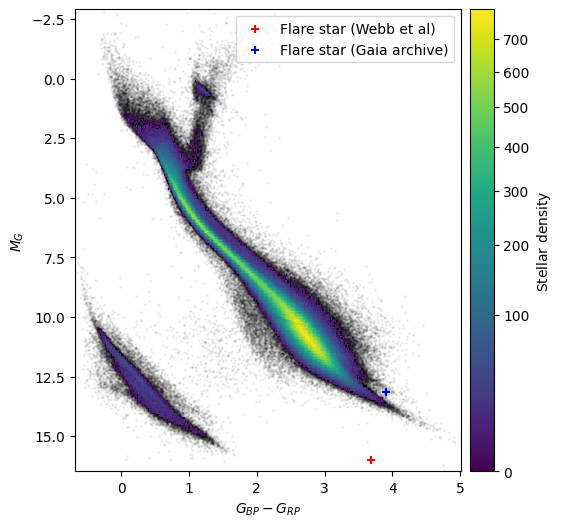

In [ ]:
from matplotlib import colors

fig, ax = plt.subplots(figsize=(6, 6))
# only show 2D-histogram for bins with more than 10 stars in them
h = ax.hist2d(bp_rp, mg, bins=300, cmin=10, norm=colors.PowerNorm(0.5), zorder=0.5)
# fill the rest with scatter (set rasterized=True if saving as vector graphics)
ax.scatter(bp_rp, mg, alpha=0.05, s=1, color='k', zorder=0)
ax.invert_yaxis()
cb = fig.colorbar(h[3], ax=ax, pad=0.02)
ax.set_xlabel(r'$G_{BP} - G_{RP}$')
ax.set_ylabel(r'$M_G$')
cb.set_label(r"$\mathrm{Stellar~density}$")


#From Webb et al 2021
flr_par = 10.2717 / 1000
flr_d = 1 / flr_par
flr_mg = 20.94 - 5 * np.log10(flr_d) + 5
flr_bp_rp = 3.69

#From Gaia
flr_par = 10.1824 / 1000
flr_d = 1 / flr_par
flr_mg_gaia = 18.1124 - 5 * np.log10(flr_d) + 5
flr_bp_rp_gaia = 3.9014

ax.scatter(flr_bp_rp, flr_mg, color='red', marker='+', label='Flare star (Webb et al)')
ax.scatter(flr_bp_rp_gaia, flr_mg_gaia, color='blue', marker='+', label='Flare star (Gaia archive)')
plt.legend(loc='upper right')
plt.show()

In [157]:
from tqdm import tqdm

## Chromatic  Distortion Analysis

In [ ]:
from utils import gcd
from scipy.interpolate import interp1d

In [ ]:
mjds = np.array([time.mjd for time in times[start:end]])
mjds

array([57374.24512305, 57374.24566513, 57374.2462379 , 57374.2467923 ,
       57374.24734976, 57374.24790305, 57374.24845713, 57374.24901523,
       57374.24958296, 57374.25013954, 57374.25069547, 57374.25125273,
       57374.25180864, 57374.25236423, 57374.25291918, 57374.25346143,
       57374.2540178 , 57374.2545668 , 57374.25513005, 57374.25570259,
       57374.25626709, 57374.25683198, 57374.25738249, 57374.25792113,
       57374.25846569, 57374.25901328, 57374.25957123, 57374.26013699,
       57374.26068924, 57374.26123814, 57374.26180654, 57374.26235905,
       57374.26291104, 57374.26346735, 57374.26402317, 57374.26457678,
       57374.26513077, 57374.26570034, 57374.26625152, 57374.26681187,
       57374.26736828, 57374.26793337, 57374.26849202, 57374.26905917,
       57374.26961341, 57374.27016994, 57374.27072284, 57374.27128492,
       57374.27184018, 57374.27240849, 57374.27297689, 57374.27352742,
       57374.27407757, 57374.27464287, 57374.27519976, 57374.27576775,
      

In [ ]:
SkyCoord(AltAz(alt=90 * u.degree, az=0 * u.degree, obstime = times[start:end][0], location=EarthLocation.of_site('Cerro Tololo'))).transform_to(ICRS()).ra.value

103.80195600143408

In [ ]:
source = ref_cube[0,:,:]
zenith = np.zeros_like(source)
center = np.zeros_like(source)

for i, imname in enumerate(imnames_timeordered[start:end]):
    
    header_0 = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/' + imname)
    imname = imname[:-8] + '_S18' + imname[-8:]
    file = '/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname 
    data = fits.getdata('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname)
    header = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname)
    time = Time(header['DATE-OBS'])

    zenith[0,i] = SkyCoord(AltAz(alt=90 * u.degree, az=0 * u.degree, obstime = time, location=EarthLocation.of_site('Cerro Tololo'))).transform_to(ICRS()).ra.value
    zenith[1,i] = SkyCoord(AltAz(alt=90 * u.degree, az=0 * u.degree, obstime = time, location=EarthLocation.of_site('Cerro Tololo'))).transform_to(ICRS()).dec.value

    center[0,i] = header_0['CENTRA']
    center[1,i] = header_0['CENTDEC']


In [ ]:
a = gcd(np.deg2rad(center[1:,]), np.deg2rad(zenith[1,:]), np.deg2rad(center[0,:]), np.deg2rad(zenith[0,:]))
b = gcd(np.deg2rad(source[1:,]), np.deg2rad(center[1,:]), np.deg2rad(source[0,:]), np.deg2rad(center[0,:]))
c = gcd(np.deg2rad(zenith[1:,]), np.deg2rad(source[1,:]), np.deg2rad(zenith[0,:]), np.deg2rad(source[0,:]))

In [ ]:
A = np.arccos( (np.cos(a) - np.cos(b) * np.cos(c))  / (np.sin(b) * np.sin(c)) ) 

Text(0, 0.5, 'Zenith-radial angle (deg)')

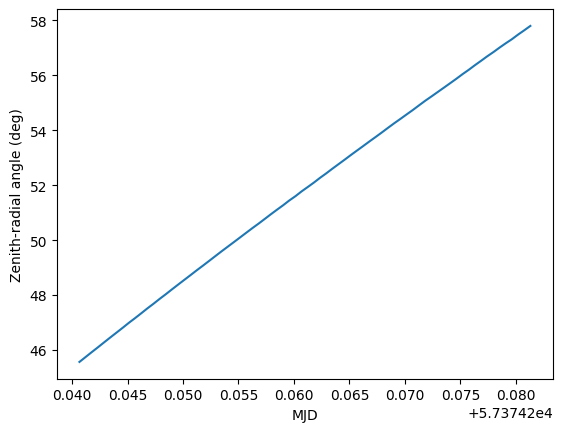

In [ ]:
theta = np.pi - A[0,:]
plt.plot([time.mjd for time in times], np.rad2deg(theta))
plt.xlabel('MJD')
plt.ylabel('Zenith-radial angle (deg)')

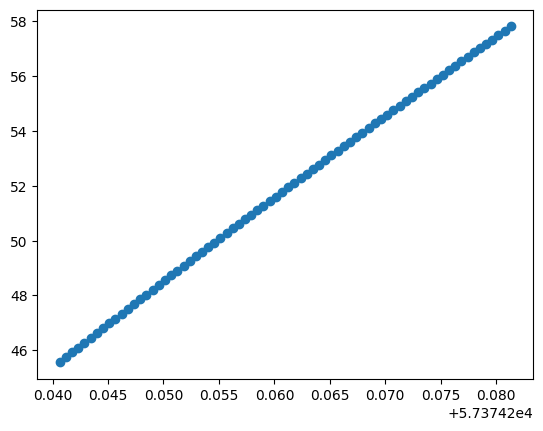

In [ ]:
from utils import chrDistAng

for i, imname in enumerate(imnames_timeordered[start:end]):

    header_0 = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/' + imname)
    imname = imname[:-8] + '_S18' + imname[-8:]
    file = '/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname 
    data = fits.getdata('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname)
    header = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/dwfflareS18/' + imname)
    time = Time(header['DATE-OBS'])

    theta = chrDistAng(coord = SkyCoord(ra = ref_cube[0,0,i] * u.deg, dec = ref_cube[0,1,i] * u.deg, obstime=time), header=header_0)

    plt.scatter(time.mjd, np.rad2deg(theta), color='C0')

Mean field angle = 0.5793135115390554


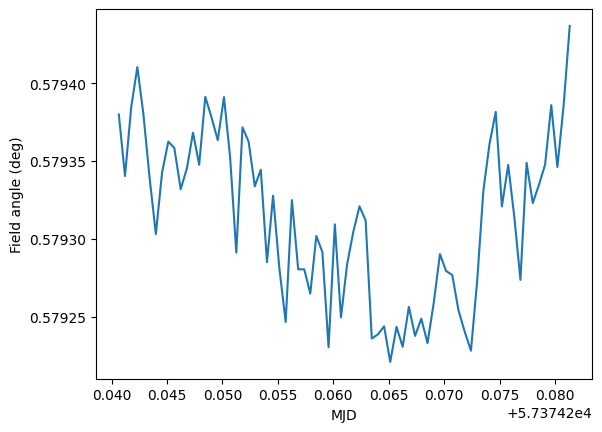

In [ ]:
plt.plot([time.mjd for time in times], np.rad2deg(b[0,:]))
plt.xlabel('MJD')
plt.ylabel('Field angle (deg)')
print('Mean field angle = {}'.format(np.rad2deg(b[0,:]).mean()))

Text(0, 0.5, 'Field angle (arcsec)')

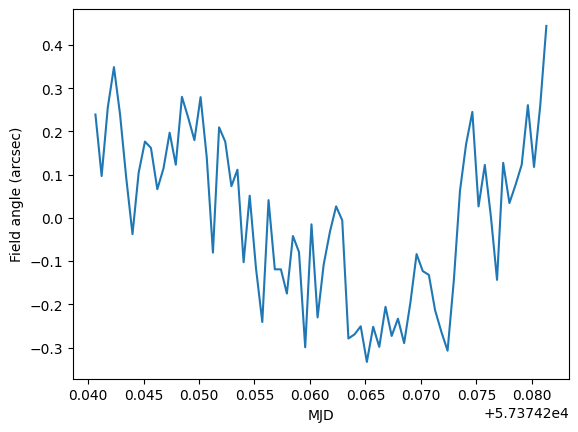

In [ ]:
plt.plot([time.mjd for time in times], (np.rad2deg(b[0,:]) - np.rad2deg(b[0,:]).mean()) * 3600)
plt.xlabel('MJD')
plt.ylabel('Field angle (arcsec)')


In [ ]:
abs((np.rad2deg(b[0,:]) - np.rad2deg(b[0,:]).mean()) * 3600).max()

0.4441636798537818

In [154]:
batoid_trace = np.array([[4000, 4200,4400,4600,4800, 5100, 5300, 5500],[-4.7265763558433775, 
                         -2.6427375813610112, 
                         -1.0704452846444354, 
                         0.029975162321676407, 
                         0.9870705151456214, 
                         2.0014959056264345, 
                         2.528961277402921,
                         2.9450944784608026]])

new_w = np.arange(4000,5500,1)
f = interp1d(x = batoid_trace[0], y=batoid_trace[1], kind='quadratic')

plt.scatter(batoid_trace[0], batoid_trace[1])
plt.plot(new_w, f(new_w))
plt.ylabel('Relative focal plane position (micron)')
plt.xlabel(r'Wavelength ($\AA$)')
plt.title('Chromatic distortion at field angle = 0.5793 deg')

NameError: name 'interp1d' is not defined

In [153]:
pixpermm = 153 / 2.3
arcsecperpix = 0.2637

new_w = np.arange(4000,5500,1)
f = interp1d(x = batoid_trace[0], y=batoid_trace[1] * 1e-3 * pixpermm * arcsecperpix, kind='cubic')


plt.scatter(batoid_trace[0], batoid_trace[1] * 1e-3 * pixpermm * arcsecperpix, color='k')
#plt.fill_betweenx(x1=lamb_eff_md('g', temp=0.0, mdpath='/Users/riley/Desktop/RAFTS/mdspec_full.npy'),
#                  x2=lamb_eff_md('g', temp=10000.0, mdpath='/Users/riley/Desktop/RAFTS/mdspec_full.npy'), y=(-0.1, 0.05), color='k', alpha=0.4)
#plt.vlines([lamb_eff_md('g', temp=0.0, mdpath='/Users/riley/Desktop/RAFTS/mdspec_full.npy')], -0.1, 0.05, color='r', label=r'$\lambda_{eff, quiescent}$')
#plt.vlines([lamb_eff_md('g', temp=10000.0, mdpath='/Users/riley/Desktop/RAFTS/mdspec_full.npy')], -0.1, 0.05, color='b', label=r'$\lambda_{eff, flare}$')
plt.plot(new_w, f(new_w), color='k', ls='--')
plt.ylabel('Relative focal plane position (arcsec)')
plt.xlabel(r'Wavelength ($\AA$)')
plt.title('Chromatic distortion at field angle = 0.5793 deg')
#plt.legend()

NameError: name 'interp1d' is not defined

In [152]:
def func(x, a, b, c):
    return (a * x**2) + (b * x) + c

xdata = batoid_trace[0]
ydata = batoid_trace[1] * 1e-3 * pixpermm * arcsecperpix

popt, pcov = curve_fit(func, xdata, ydata)

plt.scatter(batoid_trace[0], batoid_trace[1] * 1e-3 * pixpermm * arcsecperpix, color='k', s=20)
plt.plot(new_w, func(new_w, *popt), color='k', ls='--', alpha=0.6)

plt.ylabel('Relative focal plane position (arcsec)')
plt.xlabel(r'Wavelength ($\AA$)')
plt.title('Radial distortion at field angle = 0.5793 deg')
plt.grid()
plt.savefig('/Users/riley/Desktop/RAFTS/Figures/chrdist.png', dpi=300, bbox_inches='tight')

NameError: name 'pixpermm' is not defined

In [ ]:
q_weff = lamb_eff_md('g', temp=0.0, mdpath='/Users/riley/Desktop/RAFTS/mdspec_full.npy')
'Chromatic distortion at quiescence = {} arcsec'.format(f(new_w)[np.where(abs(new_w - q_weff) == abs(new_w - q_weff).min())][0])

'Chromatic distortion at quiescence = 0.02921753900297198 arcsec'

In [ ]:
n_weff = lamb_eff_md('g', temp=10000.0, mdpath='/Users/riley/Desktop/RAFTS/mdspec_full.npy')
'Chromatic distortion at 10,000K = {} arcsec'.format(f(new_w)[np.where(abs(new_w - n_weff) == abs(new_w - n_weff).min())][0])

'Chromatic distortion at 10,000K = 0.012721475248650846 arcsec'

In [ ]:
'dCD(T = 10,000K) = {} arcsec'.format(f(new_w)[np.where(abs(new_w - q_weff) == abs(new_w - q_weff).min())][0] - 
                         f(new_w)[np.where(abs(new_w - n_weff) == abs(new_w - n_weff).min())][0])

'dCD(T = 10,000K) = 0.016496063754321135 arcsec'

In [ ]:
dcr_offset(n_weff, 1.6) - dcr_offset(q_weff, 1.6)

0.18357148969727177

In [ ]:
from utils import chrDistCorr

ra, dec = ref_cube[0,:,40]
c = SkyCoord(ra, dec, unit = u.deg, obstime = times[40])
imname = imnames_timeordered[start:end][40]
header = fits.getheader('/Users/riley/Desktop/RAFTS/dwfflare/' + imname)

chrDistCorr(wavelength = n_weff, coord = c, header = header)

array([0.00775625])

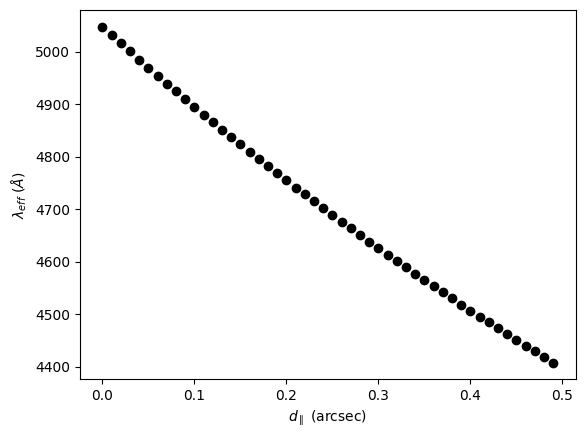

In [ ]:
from utils import R0
from scipy.optimize import minimize
from config import batoid_params

for d in np.arange(0, 0.5, 0.01):

    def obj1(weff, dpar_0, dcr_q, airmass, batoid_a, batoid_b, batoid_c, theta):
        
        R_0 = R0(weff)

        Z = np.arccos(1/airmass)

        dpar = ((np.rad2deg(R_0 * np.tan(Z)) * 3600 - dcr_q) + (((batoid_a * weff**2) + (batoid_b * weff) + batoid_c) * np.cos(np.deg2rad(theta))))
  
        return abs(dpar - dpar_0)


    dpar_0 = d
    init = 4500
    airmass = 1.6
    batoid_a, batoid_b, batoid_c = batoid_params
    theta = 52
    dcr_q = dcr_offset(lamb_eff_md('g', temp=0.0, mdpath='/Users/riley/Desktop/RAFTS/sdsstemplates/m7.active.ha.na.k_ext.npy'), airmass = airmass)

    res = minimize(obj1, init, args = (dpar_0, dcr_q, airmass, batoid_a, batoid_b, batoid_c, theta), method='Nelder-Mead', options = {'gtol':1e-3})

    plt.scatter(d, res.x, color='k')
    plt.xlabel(r'$d_{\parallel}$ (arcsec)')
    plt.ylabel(r'$\lambda_{eff}$ $(\AA)$')

### Fast Transients Metric Calculations

In [ ]:
import scipy
from utils import make_bb, fitbb_to_m5

flare absolute mag = 61.77185194095395, band: u, SpT: m7
delta mag = -5.879837918949278, band: u, SpT: m7
max rise rate = -5.879837918949278 mag/min
min rise rate = -0.03868314420361367 mag/min
max fade rate = -1.1999669222345464 mag/min
min fade rate = -0.027121023611389655 mag/min


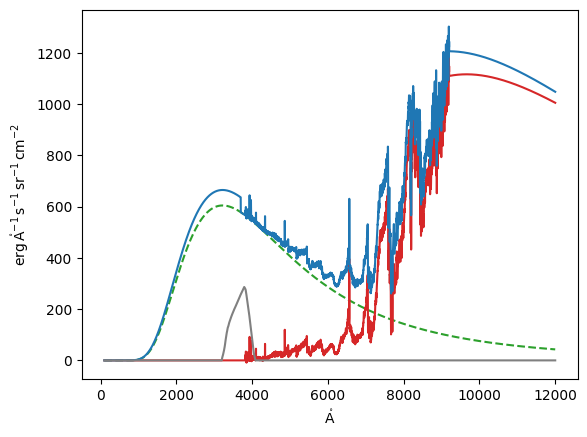

In [ ]:
band = 'u'
spt = 'm7'
wav = np.arange(100, 12000) * u.AA
plx = 10.0
dist = 1000 / plx * u.pc
Rstar = 0.1 * u.Rsun
t = 9000 
a = 0.005
balmer_ratio = 1.1

with fits.open('/Users/riley/Desktop/RAFTS/sdsstemplates/{}.active.ha.na.k.fits'.format(spt), mode="readonly") as hdulist:
       data = hdulist[0].data[0]
       header = hdulist[0].header
       wstart = hdulist[0].header[3]
       wstep = hdulist[0].header[5]
       wave = np.arange(wstart,wstart + len(data) * wstep,wstep)

f = filt_interp(band=band)
g = interp1d(wave, data, bounds_error=False, fill_value=0.0)
mds = g(wav)

sdss_inds = [np.where(wav == WMIN * u.AA)[0][0], np.where(wav == WMAX * u.AA)[0][0].sum()]

##Augment spectra
def fitbb_to_m5(a, T, m5spec):
    bb = make_bb(wav, 3000) * 1e27 * a
    relevant_w = np.argmin(np.abs(wav - WMAX*u.AA))
    indices = range(relevant_w-50, relevant_w)
    x = np.abs(((bb[indices] - m5spec[indices])).sum())
    return x

amplitude = 1
res = scipy.optimize.minimize(fitbb_to_m5, [amplitude], args=(3000, mds))
mds[wav >= WMAX*u.AA] = (make_bb(wav, 3000) * 1e27 * res.x)[wav >= WMAX*u.AA]

balmer_step = np.ones_like(wav.value)
balmer_step[wav.value < 3700] = balmer_ratio

bb = BlackBody(temperature = t * u.K, scale = 1*u.erg/u.s/u.cm/u.cm/u.AA/u.sr)
C = bb(wav)[sdss_inds[0]:sdss_inds[1]].sum().value * (a**2) / mds[sdss_inds[0]:sdss_inds[1]].sum()
bbdm = (mds * C) * (1*u.erg/u.s/u.cm/u.cm/u.AA/u.sr)
combined_bb = (bb(wav) * a**2 * balmer_step) + bbdm

flux = (np.sum(f(wav) * bbdm) / np.sum(f(wav))) * (2*np.pi*u.sr) * (Rstar.to('cm') ** 2) / ((dist.to('cm')) ** 2)
flux_flare = (np.sum(f(wav) * combined_bb) / np.sum(f(wav))) * (2*np.pi*u.sr) * (Rstar.to('cm') ** 2) / ((dist.to('cm')) ** 2)
mag = 22.5 - 2.5 * np.log10(flux.value)
mag_flare = 22.5 - 2.5 * np.log10(flux_flare.value)
delta = mag_flare - mag
abs_mag = mag - 5 * np.log10(dist.value) + 5
abs_mag_flare = mag_flare - 5 * np.log10(dist.value) + 5

print('flare absolute mag = {}, band: {}, SpT: {}'.format(abs_mag_flare, band, spt))
print('delta mag = {}, band: {}, SpT: {}'.format(delta, band, spt))
print('max rise rate = {} mag/min'.format((delta / 1))) 
print('min rise rate = {} mag/min'.format((delta / 152))) 
print('max fade rate = {} mag/min'.format((delta / 4.9))) 
print('min fade rate = {} mag/min'.format((delta / 216.8))) 


with quantity_support():
    plt.figure()
    plt.plot(wav, bb(wav)*a**2, ls='--', c='C2')
    plt.plot(wav, bbdm, c='C3')
    plt.plot(wav, combined_bb, c='C0')
    plt.plot(wav, f(wav) * (mds * C).max(), c='gray')
    plt.show()